In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib.image as img
from matplotlib import patches
import matplotlib 
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from PIL import Image
import networkx as nx 
import math
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

%matplotlib inline

In [2]:
import os
from pathlib import Path
os.getcwd()

'/Users/sarahmcguire/Library/CloudStorage/Dropbox/MSU/DirectionalTransformNN/2Dproject'

In [3]:
import cv2

## Class distribution chart

In [428]:
mypath = '../data/ALLleaves/'
classes=[]
dirlengths=[]
for path, subdirs, files in os.walk(mypath):
    files = [f for f in files if not f[0] == '.']
    subdirs[:] = [d for d in subdirs if (d[0] != '.')]
    class_label = path[18:]
    if '/' in class_label:
        class_label = class_label[:class_label.find('/')]
    if len(files)>0:
        dirlengths.append(len(files))
        classes.append(class_label)


In [429]:
class_labels=[]
class_sizes =[]
for i in range(len(classes)):
    if classes[i] in class_labels: 
            idx = class_labels.index(classes[i])
            class_sizes[idx]+= dirlengths[i]
    else:
        class_labels.append(classes[i])
        class_sizes.append(dirlengths[i])
print(class_labels)  
print(class_sizes)

['Apple', 'Passiflora', 'Ivy', 'Arabidopsis', 'Grass', 'Potato', 'Alstroemeria', 'Cotton', 'Viburnum', 'Grape', 'Brassica', 'Pepper', 'Tomato', 'Coleus']
[9619, 3298, 865, 5101, 866, 1840, 2392, 2885, 2422, 11379, 1832, 3277, 82034, 34607]


In [430]:
explode = (0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05,0.05, 0.05,0.05, 0.05)

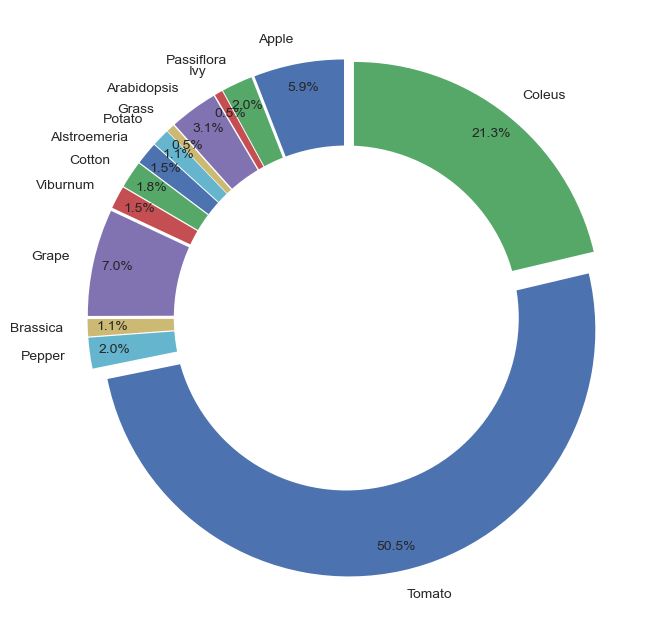

In [431]:
plt.figure(figsize = (8,8))
plt.pie(class_sizes, labels = class_labels, autopct='%1.1f%%', shadow=False, startangle=90, explode = explode, pctdistance=0.9)
# draw circle
centre_circle = plt.Circle((0, 0), 0.7, fc='white')
fig = plt.gcf()
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)
plt.savefig("figures/class_distribution_donut.png", dpi=1000, bbox_inches='tight')
plt.show()

In [432]:
#classes_df = pd.DataFrame(data = class_sizes, index = class_labels)


classes_df = pd.DataFrame({'type': class_labels,
                   'number of samples': class_sizes})
classes_df

,type,number of samples
0,Apple,9619
1,Passiflora,3298
2,Ivy,865
3,Arabidopsis,5101
4,Grass,866
5,Potato,1840
6,Alstroemeria,2392
7,Cotton,2885
8,Viburnum,2422
9,Grape,11379


In [433]:
sum(classes_df['number of samples'])

162417

In [434]:
# Alternative representation as bar chart
import seaborn as sns
plt.style.use('ggplot')

In [435]:
total = classes_df['number of samples'].sum()
percents = 100*(classes_df['number of samples'] / classes_df['number of samples'].sum())
percents

0      5.922410
1      2.030576
2      0.532580
3      3.140681
4      0.533195
5      1.132886
6      1.472752
7      1.776292
8      1.491223
9      7.006040
10     1.127961
11     2.017646
12    50.508260
13    21.307499
Name: number of samples, dtype: float64

In [436]:
plt.style.use('ggplot')

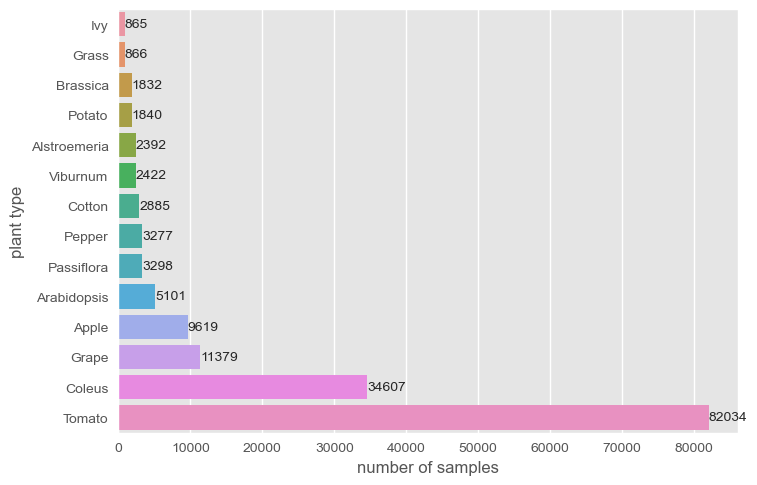

In [437]:
ax=sns.barplot(classes_df, x='number of samples',y='type', order=classes_df.sort_values('number of samples').type)
ax.bar_label(ax.containers[0], fontsize=10)
ax.set_ylabel('plant type')
plt.savefig("figures/class_distribution_chart.png", dpi=1000,bbox_inches='tight')
plt.show()

# Figure creation: example of each leaf outline

In [541]:
filenames = ['Alstroemeria/a1_AB_counterclock109.npy', 'Apple/1001_32.npy', 
             'Arabidopsis/1Arabidopsis/001_6_2.npy', 'Brassica/napus/001_2_4.npy', 
             'Coleus/Co4/Co_15_71_001_8.npy', 'Cotton/2a_861b.npy', 
             'Grape/Geneva_2013/Folder1_Jose/237621b_9T.npy', 'Grass/Aegilops_cylindrica_0004_Layer_5.npy',
             'Ivy/Vine1_10.npy', 'Passiflora/Pact1_8.npy',
             'Pepper/L_35_4_02.npy', 'Potato/3_d.npy',
             'Tomato/Tomato_asymmetry/lf1_L_L16.npy', 'Viburnum/V2/acutifolium10.npy'
            ]
classes = ['Alstroemeria', 'Apple', 
             'Arabidopsis', 'Brassica', 
             'Coleus', 'Cotton', 
             'Grape', 'Grass',
             'Ivy', 'Passiflora',
             'Pepper', 'Potato',
             'Tomato', 'Viburnum'
            ]

In [542]:
options = {
    "node_size": 1,
    "node_color": "black",
    "edgecolors": "black",
    "linewidths": 0.2,
    "width": 0.4,
    'with_labels':False,
}

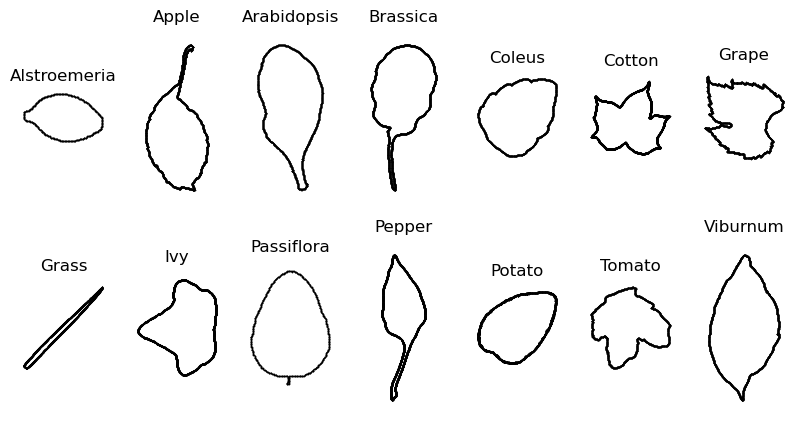

In [543]:
fig, axs = plt.subplots(2, 7, figsize=(10,5))
for i in range(14):
    row = int(i>=7)
    col = i%7
    title= classes[i]
    input_filedir = '../data/ALLleaves/' + filenames[i]
    leaf = np.load(input_filedir)

    # Create graph of leaf outline
    G = nx.Graph()
    for i in range(np.shape(leaf)[0]-1):
        G.add_edge(i, i+1)
    G.add_edge(0,np.shape(leaf)[0]-1)

    # Get the vertex positions
    pos = {}
    valuesX = leaf[:,0]
    valuesY = leaf[:,1]
    for i in range(np.shape(leaf)[0]):
        pos[i] = (valuesX[i],valuesY[i])
    
    
    nx.draw_networkx(G, pos, ax=axs[row,col], **options)
    axs[row,col].set_aspect('equal')
    axs[row,col].set_axis_off()
    axs[row,col].set_title(title)
plt.savefig("figures/plant_types.png", dpi=1000,bbox_inches='tight')
plt.show()


# Figure Generation: example of each leaf ECT

FileNotFoundError: [Errno 2] No such file or directory: '../data/ALLleaves_ECT/Arabidopsis/1Arabidopsis/001_6_2.npy'

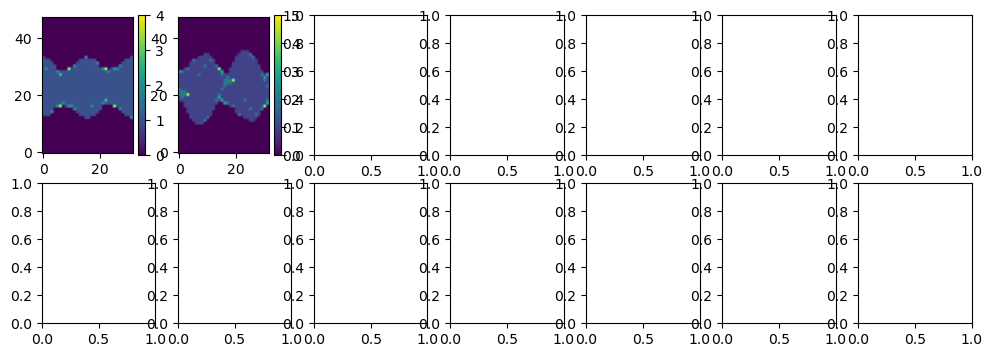

In [457]:
fig, axs = plt.subplots(2, 7, figsize=(12,4))
plt.style.use('default')
for i in range(4):
    row = int(i>=7)
    col = i%7
    title= classes[i]
    input_filedir = '../data/ALLleaves_ECT/' + filenames[i]
    leaf_ect = np.load(input_filedir)
    
    im = axs[row,col].imshow(leaf_ect, origin='lower')
    plt.colorbar(im, ax= axs[row,col])
    
    #axs[row,col].set_title(title)
#plt.savefig("figures/plant_types.png", dpi=1000,bbox_inches='tight')
plt.show()

## Directional transform "rotations"

Start with the ECT matrix and randomly change cylinder "cut point" to simulate or start with leaf outline graphs and randomly rotate them, recomputing ECT for the rotated graphs.
- Start with leaf images

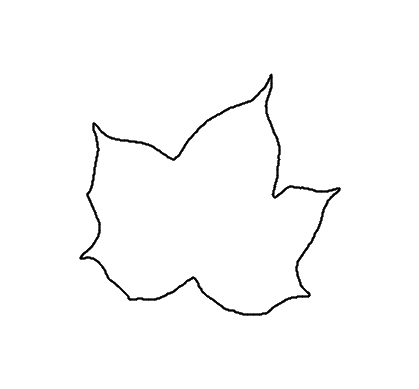

In [460]:
input_filedir = '../data/ALLleaves/Cotton/2a_861b.npy'
#input_filedir = '../data/ALLleaves/Grape/Geneva_2016/Dan_Geneva_2016/171a_5.npy'
leaf = np.load(input_filedir)

# Create graph of leaf outline
G = nx.Graph()
for i in range(np.shape(leaf)[0]-1):
    G.add_edge(i, i+1)
G.add_edge(0,np.shape(leaf)[0]-1)

# Get the vertex positions
pos = {}
valuesX = leaf[:,0]
valuesY = leaf[:,1]
for i in range(np.shape(leaf)[0]):
    pos[i] = (valuesX[i],valuesY[i])
    
options = {
    "node_size": 1,
    "node_color": "black",
    "edgecolors": "black",
    "linewidths": 0.2,
    "width": 0.4,
    'with_labels':False,
}
nx.draw_networkx(G, pos, **options)

# Set margins for the axes so that nodes aren't clipped
ax = plt.gca()
ax.margins(0.20)
ax.set_aspect('equal')
plt.axis("off")
plt.show()

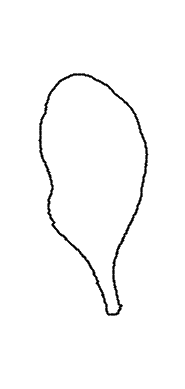

In [463]:
input_filedir = '../data/ALLleaves/Arabidopsis/1Arabidopsis/001_6_2.npy'
#Apple/1001_32.npy'
#Alstroemeria/a1_AB_counterclock109.npy'
# ', 
#', 
#'Brassica/napus/001_2_4.npy', 
             #'Coleus/Co4/Co_15_71_001_8.npy', 'Cotton/2a_861b.npy', 
             #'Grape/Geneva_2013/Folder1_Jose/237621b_9T.npy', 'Grass/Aegilops_cylindrica_0004_Layer_5.npy',
             #'Ivy/Vine1_10.npy', 'Passiflora/Pact1_8.npy',
             #'Pepper/L_35_4_02.npy', 'Potato/3_d.npy',
             #'Tomato/Tomato_asymmetry/lf1_L_L16.npy', 'Viburnum/V2/acutifolium10.npy'
            
leaf = np.load(input_filedir)

# Create graph of leaf outline
G4 = nx.Graph()
for i in range(np.shape(leaf)[0]-1):
    G4.add_edge(i, i+1)
G4.add_edge(0,np.shape(leaf)[0]-1)

# Get the vertex positions
pos4 = {}
valuesX = leaf[:,0]
valuesY = leaf[:,1]
for i in range(np.shape(leaf)[0]):
    pos4[i] = (valuesX[i],valuesY[i])
    
options = {
    "node_size": 1,
    "node_color": "black",
    "edgecolors": "black",
    "linewidths": 0.2,
    "width": 0.4,
    'with_labels':False,
}
nx.draw_networkx(G4, pos4, **options)

# Set margins for the axes so that nodes aren't clipped
ax = plt.gca()
ax.margins(0.20)
ax.set_aspect('equal')
plt.axis("off")
plt.show()

In [128]:
def rotate_around_point(point, radians, origin=(0, 0)):
    """Rotate a point around an origin (default = (0,0)).
    """
    x, y = point
    ox, oy = origin

    rx = ox + math.cos(radians) * (x - ox) + math.sin(radians) * (y - oy)
    ry = oy + -math.sin(radians) * (x - ox) + math.cos(radians) * (y - oy)

    return rx, ry

In [442]:
# find a bounding box of points
def bounding_box(points):
    x_coord, y_coord = zip(*points)
    return [(min(x_coord), min(y_coord)), (max(x_coord), max(y_coord))]

In [495]:
#pos_list = list(pos.values())
pos_list = list(pos.values())
#pos_list.extend(list(pos2.values()))
pos_list.extend(list(pos3.values()))
pos_list.extend(list(pos4.values()))

In [496]:
x_box,y_box = zip(*bounding_box(pos_list))
mean_center = (np.mean(x_box), np.mean(y_box)) #Using average x and y values as center
dist = (math.dist(bounding_box(pos_list)[0],bounding_box(pos_list)[1]))
r = dist/2
print(r)

1.945209071668133


# Plot bounding box figure

In [519]:
from math import atan2,degrees
import numpy as np
#Label line with line2D label data
def labelLine(line,x,label=None,align=True,**kwargs):

    ax = line.axes
    xdata = line.get_xdata()
    ydata = line.get_ydata()

    if (x < xdata[0]) or (x > xdata[-1]):
        print('x label location is outside data range!')
        return

    #Find corresponding y co-ordinate and angle of the line
    ip = 1
    for i in range(len(xdata)):
        if x < xdata[i]:
            ip = i
            break

    y = ydata[ip-1] + (ydata[ip]-ydata[ip-1])*(x-xdata[ip-1])/(xdata[ip]-xdata[ip-1])

    if not label:
        label = line.get_label()

    if align:
        #Compute the slope
        dx = xdata[ip] - xdata[ip-1]
        dy = ydata[ip] - ydata[ip-1]
        ang = degrees(atan2(dy,dx))

        #Transform to screen co-ordinates
        pt = np.array([x,y]).reshape((1,2))
        trans_angle = ax.transData.transform_angles(np.array((ang,)),pt)[0]

    else:
        trans_angle = 0

    #Set a bunch of keyword arguments
    if 'color' not in kwargs:
        kwargs['color'] = line.get_color()
        

    if ('horizontalalignment' not in kwargs) and ('ha' not in kwargs):
        kwargs['ha'] = 'center'

    if ('verticalalignment' not in kwargs) and ('va' not in kwargs):
        kwargs['va'] = 'center'

    if 'backgroundcolor' not in kwargs:
        kwargs['backgroundcolor'] = ax.get_facecolor()

    if 'clip_on' not in kwargs:
        kwargs['clip_on'] = True

    if 'zorder' not in kwargs:
        kwargs['zorder'] = 2.5

    ax.text(x,y,label,rotation=trans_angle,**kwargs)

def labelLines(lines,align=True,xvals=None,**kwargs):

    ax = lines[0].axes
    labLines = []
    labels = []

    #Take only the lines which have labels other than the default ones
    for line in lines:
        label = line.get_label()
        if "_line" not in label:
            labLines.append(line)
            labels.append(label)

    if xvals is None:
        xmin,xmax = ax.get_xlim()
        xvals = np.linspace(xmin,xmax,len(labLines)+2)[1:-1]

    for line,x,label in zip(labLines,xvals,labels):
        labelLine(line,x,label,align,**kwargs)

In [498]:
midpt = ((x_box[0]+x_box[1])/2, (y_box[0]+y_box[1])/2)
print(midpt)
print(math.dist((x_box[0], y_box[0]),(x_box[1], y_box[1]))/2)
print(math.dist((0,0),(x_box[1], y_box[1])))
print(math.dist((0,0),(x_box[0], y_box[0])))

(-0.0016500000000000403, 0.045399999999999996)
1.945209071668133
1.9804070919889172
1.9104429277002755


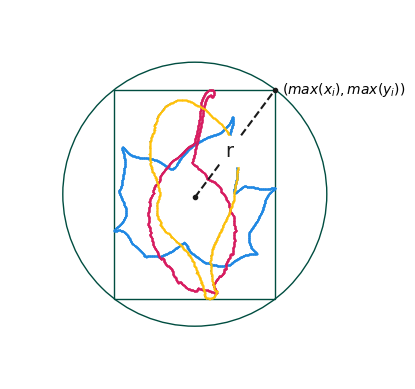

In [521]:
matplotlib.style.use('default')
ax = plt.gca()
options1 = {
    "node_size": 1,
    "node_color": "#1E88E5",
    "edgecolors": "#1E88E5",
    "linewidths": 0.2,
    "width": 0.4,
    'with_labels':False,
}
options2 = {
    "node_size": 1,
    "node_color": "#D81B60",
    "edgecolors": "#D81B60",
    "linewidths": 0.2,
    "width": 0.4,
    'with_labels':False,
}
options3 = {
    "node_size": 1,
    "node_color": "#FFC107",
    "edgecolors": "#FFC107",
    "linewidths": 0.2,
    "width": 0.4,
    'with_labels':False,
}
nx.draw_networkx(G, pos, **options1)
nx.draw_networkx(G3, pos3, **options2)
nx.draw_networkx(G4, pos4, **options3)

#plt.scatter(x_box[1], y_box[1], color='k')
#plt.scatter(0,0, color='k')
plt.plot([0, x_box[1]], [0, y_box[1]], linestyle='dashed', marker = '.', label='r',color='k')
ax.annotate(xy=(x_box[1], y_box[1]), xytext=(5,0), textcoords='offset points', text='$(max(x_i),max(y_i))$', va='center')
labelLines(plt.gca().get_lines(),align=False,fontsize=14, xvals=[.51])

width = abs(x_box[0])+abs(x_box[1])
height = abs(y_box[0])+abs(y_box[1])
rect = patches.Rectangle((x_box[0],y_box[0]), width,height, linewidth=1, edgecolor='#004D40', facecolor='none')
circle = plt.Circle(midpt, r, color='#004D40', fill=False)

ax.add_artist(rect)
ax.add_patch(circle)

# Set margins for the axes so that nodes aren't clipped
ax.margins(0.20)
plt.axis("off")
ax.set_aspect('equal')


plt.savefig("figures/boundingbox.png", dpi=1000, bbox_inches='tight')
plt.show()


## SECT testing

Take precomputed ECT matrix and get the SECT

In [428]:
plt.style.use('default')

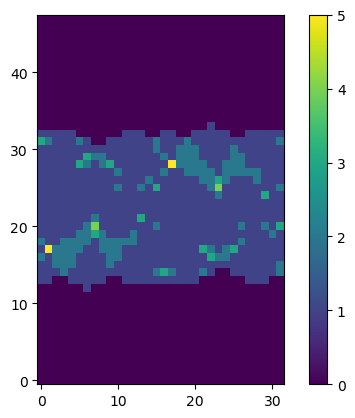

In [464]:
input_filedir = '../data/ALLleaves_ECT/Cotton/2a_861b.npy'
#'../data/ALLleaves_ECT/Grape/Geneva_2013/Folder1_Jose/237621a_8N.npy'
#
#
#
#'../data/ALLleaves_ECT/ivy/Vine2_6.npy'
#'../data/ALLleaves_ECT/apple/1008_2_155.npy'
#'../data/ALLleaves_ECT/Potato/2_a.npy'
#'../data/ALLleaves_ECT/Tomato/wild/WB/WB_1a1_h_2b.npy'
#'../data/ALLleaves_ECT/Grass/Aegilops_cylindrica_0004_Layer_5.npy'

#'../data/ALLleaves_ECT/passiflora/Pact1_11.npy'
#'../data/ALLleaves_ECT/ivy/Vine2_6.npy'
#
leaf_ect = np.load(input_filedir)
plt.imshow(leaf_ect, origin='lower')
plt.colorbar()
plt.savefig("outputs/example_cotton_ect.png", dpi=1000, bbox_inches='tight')


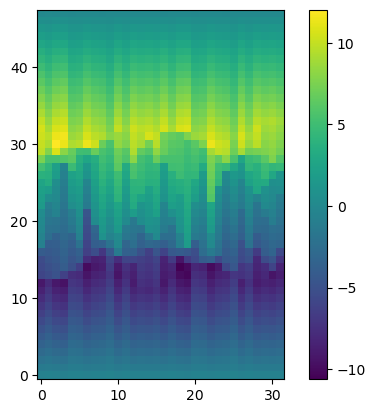

In [451]:
# compute average of each direction omega (i.e. column)
col_means = np.mean(leaf_ect, axis=0)
# subtract it so that the mean of each column is zero
leaf_ect_zero = leaf_ect-col_means
# Take integral from bottom to top of matrix (from first to last threshold)
leaf_sect = np.cumsum(leaf_ect_zero, axis=0)
plt.imshow(leaf_sect, origin='lower')
plt.colorbar()

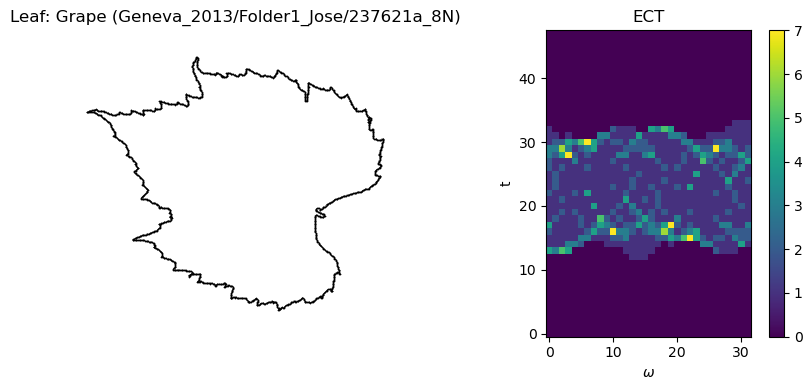

In [462]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(8, 4))
# Create graph of leaf outline
input_filedir = '../data/ALLleaves/Grape/Geneva_2013/Folder1_Jose/237621a_8N.npy'
leaf = np.load(input_filedir)
G = nx.Graph()
for i in range(np.shape(leaf)[0]-1):
    G.add_edge(i, i+1)
G.add_edge(0,np.shape(leaf)[0]-1)

# Get the vertex positions
pos = {}
valuesX = leaf[:,0]
valuesY = leaf[:,1]
for i in range(np.shape(leaf)[0]):
    pos[i] = (valuesX[i],valuesY[i])

nx.draw_networkx(G, pos, ax=ax1, **options)
ax1.set_aspect('equal')
ax1.set_title('Leaf: Grape (Geneva_2013/Folder1_Jose/237621a_8N)')
ax1.set_axis_off()
im2 = ax2.imshow(leaf_ect, origin='lower')
ax2.set_title('ECT')
ax2.set_xlabel('$\omega$')
ax2.set_ylabel('t')
plt.colorbar(im2, ax=ax2)



plt.tight_layout()
fig.savefig("outputs/example_Grape.png", dpi=1000, bbox_inches='tight')
plt.show()

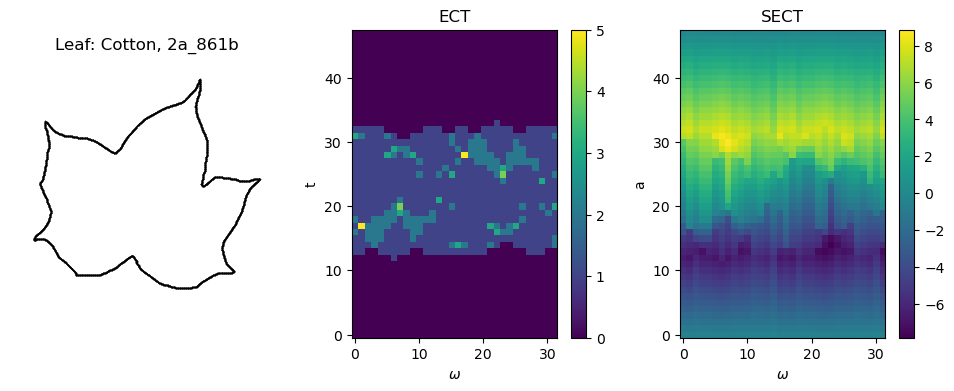

In [449]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3,figsize=(12, 4))
#fig.suptitle('Leaf: Cotton, 2a_861b')
nx.draw_networkx(G, pos, ax=ax1, **options)
ax1.set_aspect('equal')
ax1.set_title('Leaf: Cotton, 2a_861b')
ax1.set_axis_off()
im2 = ax2.imshow(leaf_ect, origin='lower')
ax2.set_title('ECT')
ax2.set_xlabel('$\omega$')
ax2.set_ylabel('t')
plt.colorbar(im2, ax=ax2)
im3 = ax3.imshow(leaf_sect, origin='lower')
ax3.set_title('SECT')
ax3.set_xlabel('$\omega$')
ax3.set_ylabel('a')
plt.colorbar(im3, ax=ax3)
plt.show()
#plt.tight_layout()

fig.savefig("outputs/cotton_example.png", dpi=1000)

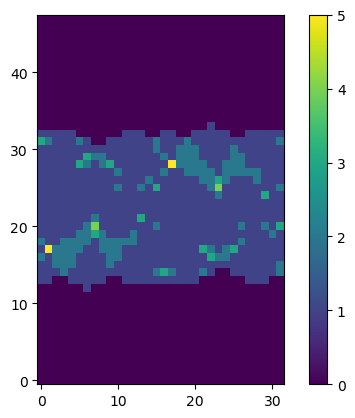

In [288]:
input_filedir = '../data/ALLleaves_ECT_Cotton_rotation/rotation0.npy'
leaf_ect = np.load(input_filedir)
plt.imshow(leaf_ect, origin='lower')
plt.colorbar()
#plt.savefig("outputs/example_cotton_ect.png", dpi=1000, bbox_inches='tight')

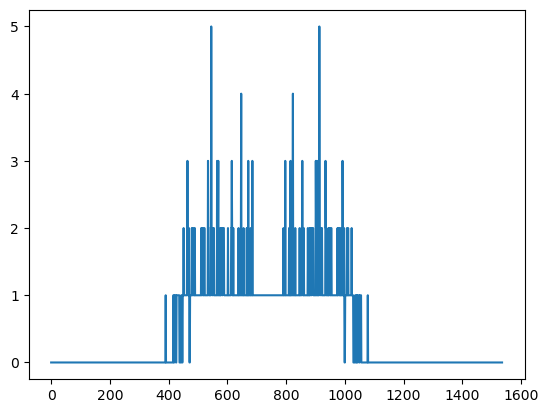

In [289]:
ect_v1 = leaf_ect.reshape(32*48,1)
plt.plot(np.arange(0, 32*48), ect_v1)

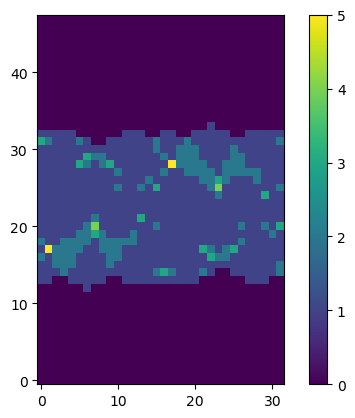

In [290]:
plt.imshow(leaf_ect, origin='lower')
plt.colorbar()

In [291]:
from matplotlib.colors import LogNorm

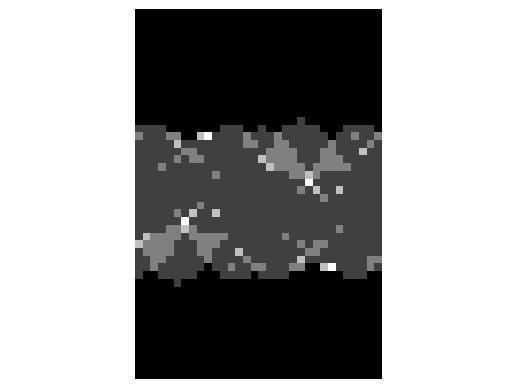

In [295]:
input_filedir = '../data/ALLleaves_ECT_Cotton_rotation/rotation1.npy'
leaf_ect = np.load(input_filedir)
plt.imshow(leaf_ect, origin='lower', cmap='gray')
plt.axis('off')
plt.axis('equal')
plt.savefig('figures/cottonECT.png', dpi=1000, bbox_inches='tight')

In [561]:
leaf_ect.min()

0.0

In [287]:
leaf_ect_norm = (leaf_ect - np.min(leaf_ect)) / (np.max(leaf_ect) - np.min(leaf_ect))
plt.imshow(leaf_ect_norm, origin='lower', cmap='gray')
#plt.imshow(leaf_ect_norm, origin='lower')

NameError: name 'leaf_ect' is not defined

In [563]:
leaf_ect_norm.min()

0.0

In [583]:
import torch.nn.functional as F
leaf_t = torch.tensor(leaf_ect)
leaf_t_norm= F.normalize(leaf_t)
print(leaf_t_norm.min())

tensor(0., dtype=torch.float64)


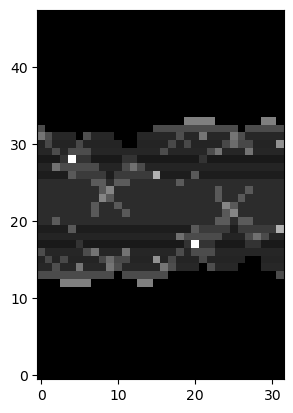

In [585]:
plt.imshow(leaf_t_norm, origin='lower', cmap='gray')

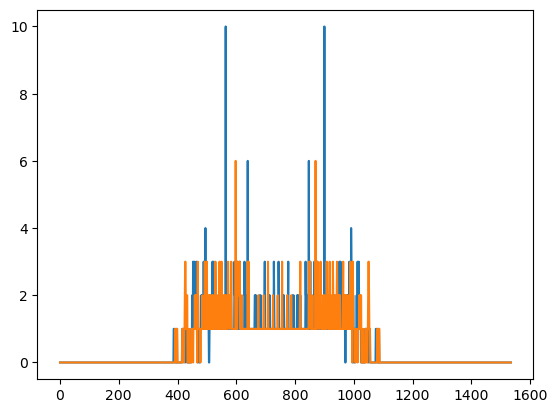

In [510]:
plt.plot(np.arange(0, 32*48), ect_v2)
plt.plot(np.arange(0, 32*48), ect_v1)

# Testing Scaled input data

In [552]:
input_filedir = '../data/AllLeaf_coordinates/Cotton/02.Nonscale_xy/9b_851b.txt'
leaf_nonscale = np.loadtxt(input_filedir, delimiter = ',')

input_filedir = '../data/AllLeaf_coordinates/Cotton/03.Scale_xy/9b_851b.txt'
leaf_scale = np.loadtxt(input_filedir, delimiter = ',')

input_filedir = '../data/AllLeaves/Cotton/9b_851b.npy'
leaf = np.load(input_filedir)

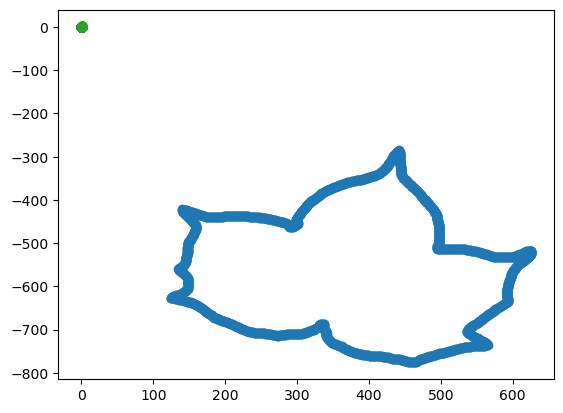

In [554]:
plt.scatter(leaf_nonscale[:,0],leaf_nonscale[:,1])
plt.scatter(leaf_scale[:,0],leaf_scale[:,1])
plt.scatter(leaf[:,0],leaf[:,1])

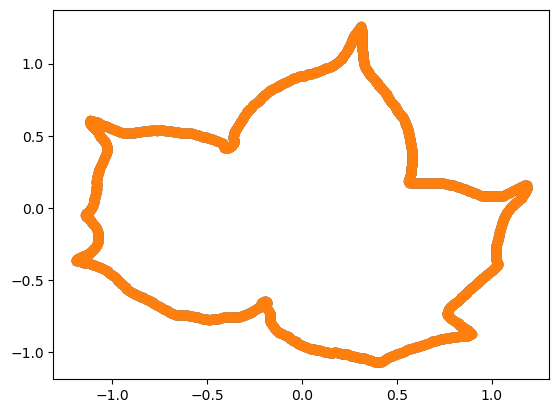

In [555]:
plt.scatter(leaf[:,0],leaf[:,1])
plt.scatter(leaf_scale[:,0],leaf_scale[:,1])


# Turning outlines into images for CNN classification baseline

In [104]:
leaf = np.load('../data/ALLleaves/Cotton/720b_1227a.npy')

In [105]:
# Plot the scatterplot of each datapoint and save it as a png 

In [ ]:
mypath = '../data/ALLleaves/'
mypath_output = '../data/ALLleaves_images_/'
# loop through file system
classes=[]
for path, subdirs, files in os.walk(mypath):
    classes.extend(subdirs)
    files = [f for f in files if not f[0] == '.']
    subdirs[:] = [d for d in subdirs if (d[0] != '.')]
    print('Computing image version of outlines in ', path, '...')
    print(len(files))
    for name in files:
        input_filedir = os.path.join(path, name)
        output_filedir = os.path.join(mypath_output+ input_filedir[len(mypath):-3])
        leaf = np.load(input_filedir)
        G = nx.Graph()
        for i in range(np.shape(leaf)[0]-1):
            G.add_edge(i, i+1)
        G.add_edge(0,np.shape(leaf)[0]-1)

        # Get the vertex positions
        pos = {}
        valuesX = leaf[:,0]
        valuesY = leaf[:,1]
        for i in range(np.shape(leaf)[0]):
            pos[i] = (valuesX[i],valuesY[i])
        
        #Plot the leaf
        plt.figure()
        nx.draw_networkx(G, pos, **options)
        plt.axis('off')
        plt.axis('equal')


        # PNG file to save
        Path(os.path.dirname(output_filedir)).mkdir(parents=True, exist_ok=True)
        plt.savefig(output_filedir)
        plt.close()

    print('----------------\n completed subdirectory ', path ,'\n-------------', )

Computing image version of outlines in  ../data/ALLleaves/ ...
0
----------------
 completed subdirectory  ../data/ALLleaves/ 
-------------
Computing image version of outlines in  ../data/ALLleaves/Apple ...
9619
----------------
 completed subdirectory  ../data/ALLleaves/Apple 
-------------
Computing image version of outlines in  ../data/ALLleaves/Passiflora ...
3298
----------------
 completed subdirectory  ../data/ALLleaves/Passiflora 
-------------
Computing image version of outlines in  ../data/ALLleaves/test ...
76
----------------
 completed subdirectory  ../data/ALLleaves/test 
-------------
Computing image version of outlines in  ../data/ALLleaves/Ivy ...
865
----------------
 completed subdirectory  ../data/ALLleaves/Ivy 
-------------
Computing image version of outlines in  ../data/ALLleaves/Arabidopsis ...
0
----------------
 completed subdirectory  ../data/ALLleaves/Arabidopsis 
-------------
Computing image version of outlines in  ../data/ALLleaves/Arabidopsis/Arabidops

(48, 32, 3)

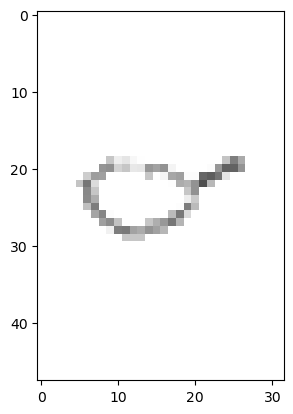

In [549]:
input_filedir = '../data/ALLleaves_images_small/Apple/1001_25.png'
leaf = np.load('../data/ALLleaves_ECT/Apple/1001_25.npy')
image = cv2.imread(input_filedir) 
plt.imshow(image)
image.shape

In [116]:
#input_filedir = '../data/ALLleaves/Grape/Geneva_2013/Folder11_Darren2/597257a_1T.npy'
input_filedir = '../data/ALLleaves/Grass/Aegilops_cylindrica_0003_Layer_4.npy'

output_filedir = "outputs/leaf_image.png"
leaf = np.load(input_filedir)

G = nx.Graph()
for i in range(np.shape(leaf)[0]-1):
    G.add_edge(i, i+1)
G.add_edge(0,np.shape(leaf)[0]-1)

# Get the vertex positions
pos = {}
valuesX = leaf[:,0]
valuesY = leaf[:,1]
for i in range(np.shape(leaf)[0]):
    pos[i] = (valuesX[i],valuesY[i])
    
plt.figure(figsize=(5,5))
nx.draw_networkx(G, pos, **options)
plt.axis('off')
plt.axis('equal')

# PNG file to save
Path(os.path.dirname(output_filedir)).mkdir(parents=True, exist_ok=True)
plt.savefig(output_filedir, dpi=18)
plt.close()


In [6]:
import networkx as nx

In [55]:
image = cv2.imread("outputs/leaf_image.png") 


In [56]:
image.shape

(480, 640, 3)

In [58]:
image[:,:,0].shape

(480, 640)

# Animation of leaf rotation

In [67]:
import matplotlib.animation as animation
import networkx as nx
import math
import cv2

In [609]:
input_filedir = '../data/ALLleaves_ECT_cotton_rotation/rotation0'
outline = cv2.imread(input_filedir+'.png') 
ect = np.load(input_filedir+'.npy')

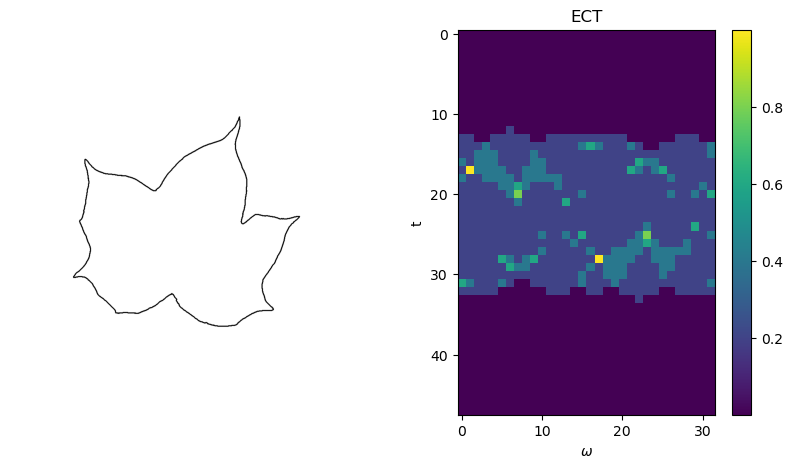

In [72]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
#fig.suptitle('Horizontally stacked subplots')
ax1.imshow(outline)
ax1.set_aspect('equal')
ax1.set_axis_off()
ax2.imshow(ect)
ax2.set_title('ECT')
ax2.set_xlabel('$\omega$')
ax2.set_ylabel('t')
plt.colorbar(im2, ax=ax2)

### Animation of cotton leaf ECT

In [532]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))

input_filedir = '../data/ALLleaves_ECT_cotton_rotation/rotation0'
outline = cv2.imread(input_filedir+'.png') 
ect = np.load(input_filedir+'.npy')

im1 = ax1.imshow(outline[:,:,::-1], animated=True)
ax1.set_aspect('equal')
ax1.set_axis_off()

im2 = ax2.imshow(ect, origin='lower', cmap='Blues', animated=True)
plt.colorbar(im2,ax=ax2)
ax2.set_xticks([0, 8, 16, 24, 31]) 
ax2.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
ax2.set_title('ECT')
ax2.set_xlabel('$\omega$')
ax2.set_ylabel('t')

def updatefig(i):
    input_filedir = '../data/ALLleaves_ECT_cotton_rotation/rotation' +str(i)
    outline = cv2.imread(input_filedir+'.png') 
    ect = np.load(input_filedir+'.npy')
    im1.set_array(outline[:,:,::-1])
    im2.set_array(ect)
    return im1,im2

ani = animation.FuncAnimation(fig, updatefig, frames=50, interval=150, blit=True)
ani.save("leafECTgif.gif")
ani.save("leafECTmovie.mp4")
video = ani.to_html5_video()
html = display.HTML(video)
display.display(html) 
plt.close()

### Animation of simple graph ECT

In [69]:
rad = 1
ticks = np.linspace(0,47,7)
tick_labels = np.linspace(rad,-rad,7)
print(ticks)
print(tick_labels)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))

input_filedir = '../data/ALLleaves_ECT_graph_rotation/rotation0'
outline = cv2.imread(input_filedir+'.png') 
ect = np.load(input_filedir+'.npy')

im1 = ax1.imshow(outline[:,:,::-1], animated=True)
ax1.set_aspect('equal')
ax1.set_axis_off()

im2 = ax2.imshow(ect, cmap='Blues',origin='lower', animated=True) #cmap=plt.get_cmap('gray')
plt.colorbar(im2,ax=ax2)
ax2.set_xticks([0, 8, 16, 24, 31]) 
ax2.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
ax2.set_title('ECT')
ax2.set_xlabel('$\omega$')
ax2.set_ylabel('t')
ax2.set_yticks(ticks) 
ax2.set_yticklabels([f'{x:1.1f}' for x in tick_labels])

def updatefig(i):
    input_filedir = '../data/ALLleaves_ECT_graph_rotation/rotation' +str(i)
    outline = cv2.imread(input_filedir+'.png') 
    ect = np.load(input_filedir+'.npy')
    im1.set_array(outline[:,:,::-1])
    im2.set_array(ect)
    return im1,im2

ani = animation.FuncAnimation(fig, updatefig, frames=50, interval=150, blit=True)
ani.save("graphECTgif.gif")
ani.save("graphECTmovie.mp4")
video = ani.to_html5_video()
#html = display.HTML(video)
#display.display(html) 
plt.close()

[ 0.          7.83333333 15.66666667 23.5        31.33333333 39.16666667
 47.        ]
[ 1.          0.66666667  0.33333333  0.         -0.33333333 -0.66666667
 -1.        ]


# SVM on the leaf dataset

In [31]:
%matplotlib inline
import seaborn as sns
sns.set_style('whitegrid')

from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.svm import LinearSVC

from sklearn.decomposition import PCA

In [32]:
image_path ='../data/ALLleaves_ECT'

classes = []
for (dirpath, dirnames, filenames) in os.walk(image_path):
    classes.extend(dirnames)
    break
print(classes)

['Apple', 'Passiflora', 'Ivy', 'Arabidopsis', 'Grass', 'Potato', 'Alstroemeria', 'Cotton', 'Viburnum', 'Grape', 'Brassica', 'Pepper', 'Tomato', 'Coleus']


In [41]:
def translate_np(mat):
    # get random rotation angle, use to determine how many columns to shift
    r_angle = random.uniform(0, 2*np.pi)
    cols = np.linspace(0,2*np.pi, 32)
    col_idx = min(range(len(cols)), key=lambda i: abs(cols[i]-r_angle))
    #Translate columns of image according to the random angle
    first = mat[:,col_idx:]
    second = mat[:,0:col_idx]
    new_image = np.concatenate((first,second), axis=1)
    return new_image

In [42]:
all_data = []

for path, subdirs, files in os.walk(image_path):

    files = [f for f in files if not f[0] == '.']
    subdirs[:] = [d for d in subdirs if not d[0] == '.']

    for name in files:
        input_filedir = os.path.join(path, name)
        ect_normal = np.load(input_filedir)
        # Randomly rotate each leaf (done by translating matrix by some random angle rotation)
        ect_r = translate_np(ect_normal)
        leaf_vector = ect_r.flatten('F')
        splitpath = os.path.normpath(input_filedir).split(os.path.sep)
        label = list(set(splitpath).intersection(classes))[0]
        
        leaf_list = [input_filedir, label] + list(leaf_vector)

        all_data.append(leaf_list)

In [43]:
col_names = ['filename', 'label'] + ['t'+str(i) for i in range(32*48)]

In [44]:
df = pd.DataFrame(all_data, columns=col_names)
df.head()

,filename,label,t0,t1,t2,t3,t4,t5,t6,t7,...,t1526,t1527,t1528,t1529,t1530,t1531,t1532,t1533,t1534,t1535
0,../data/ALLleaves_ECT/Apple/4187_2_2842.npy,Apple,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,../data/ALLleaves_ECT/Apple/2151_2634.npy,Apple,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,../data/ALLleaves_ECT/Apple/1220_2_1744.npy,Apple,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,../data/ALLleaves_ECT/Apple/1178_692.npy,Apple,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,../data/ALLleaves_ECT/Apple/1010_686.npy,Apple,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


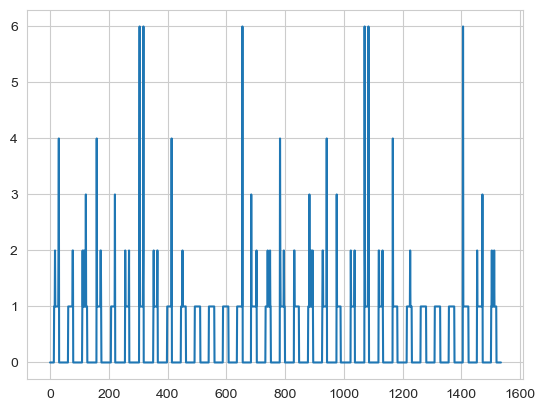

In [45]:
plt.plot(leaf_vector)

In [46]:
X = df.drop(['filename', 'label'], axis=1)
y = df.label

print(f"'X' shape: {X.shape}")
print(f"'y' shape: {y.shape}")

pipeline = Pipeline([
    ('min_max_scaler', MinMaxScaler()),
    ('std_scaler', StandardScaler())
])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

'X' shape: (162417, 1536)
'y' shape: (162417,)


In [47]:
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")
        plt.figure(figsize=(20,10)) 
        sns.heatmap(confusion_matrix(y_test, pred, normalize='true'), cmap="Blues",annot=True) 

/Users/sarahmcguire/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Train Result:
Accuracy Score: 73.37%
_______________________________________________
CLASSIFICATION REPORT:
           Alstroemeria        Apple  Arabidopsis     Brassica        Coleus  \
precision      0.504435     0.418294     0.327561     0.023529      0.734257   
recall         0.276932     0.529031     0.063728     0.001563      0.876960   
f1-score       0.357564     0.467190     0.106698     0.002930      0.799289   
support     1643.000000  6803.000000  3562.000000  1280.000000  24106.000000   

                Cotton        Grape       Grass         Ivy   Passiflora  \
precision     0.625000     0.810776    0.905751    0.570776     0.267606   
recall        0.095122     0.859312    0.907200    0.408497     0.016344   
f1-score      0.165114     0.834339    0.906475    0.476190     0.030807   
support    2050.000000  7968.000000  625.000000  612.000000  2325.000000   

                Pepper  Potato        Tomato     Viburnum  accuracy  \
precision     0.718996     0.0      0.7

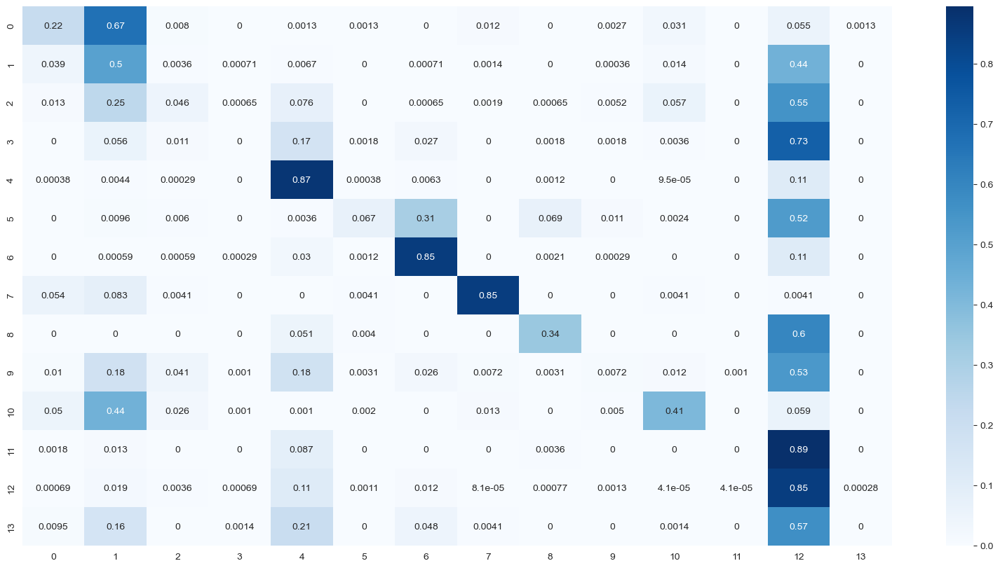

In [48]:
#model = LinearSVC(loss='hinge', dual=True)
model = LinearSVC()
model.fit(X_train, y_train)

print_score(model, X_train, y_train, X_test, y_test, train=True)
print_score(model, X_train, y_train, X_test, y_test, train=False)

# with cross validation

In [49]:
# For K-fold cross validation
k_folds = 10

scores = cross_val_score(model, X, y, cv=k_folds)

print(scores)
print("%0.2f%% accuracy with a standard deviation of %0.2f" % (scores.mean()*100, scores.std()*100))


/Users/sarahmcguire/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/sarahmcguire/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/sarahmcguire/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/sarahmcguire/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/sarahmcguire/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/sarahmcguire/opt/anaconda3/lib/python3

[0.67294668 0.6238148  0.74375077 0.72435661 0.70785618 0.74362763
 0.66007881 0.6867188  0.7277877  0.71658149]
70.08% accuracy with a standard deviation of 3.72


/Users/sarahmcguire/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [50]:
pred = model.predict(X_test)
clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
print("Test Result:\n================================================")        
print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
print("_______________________________________________")
print(f"CLASSIFICATION REPORT:\n{clf_report}")
print("_______________________________________________")
print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")
#plt.figure(figsize=(20,10)) 
#sns.heatmap(confusion_matrix(y_test, pred, normalize='true'), cmap="Blues",annot=True) 

cf_matrix = confusion_matrix(y_test, pred, normalize = 'true')
df_norm = pd.DataFrame(cf_matrix, index = [i for i in classes], columns = [i for i in classes])
plt.figure(figsize = (12,7))
sns.heatmap(df_norm, annot=True, fmt=".3f", cmap = 'Blues', norm=LogNorm(), vmin=0, vmax=np.max(cf_matrix))
plt.xlabel('Predicted Label', weight='bold')
plt.ylabel('True Label', weight='bold')
#plt.savefig('outputs/cf_norm_logscale.png', dpi=1000, bbox_inches='tight')

Test Result:
Accuracy Score: 72.40%
_______________________________________________
CLASSIFICATION REPORT:
           Alstroemeria        Apple  Arabidopsis  Brassica        Coleus  \
precision      0.415190     0.390156     0.274131       0.0      0.723332   
recall         0.218959     0.498224     0.046134       0.0      0.872393   
f1-score       0.286713     0.437617     0.078977       0.0      0.790900   
support      749.000000  2816.000000  1539.000000     552.0  10501.000000   

               Cotton        Grape       Grass         Ivy  Passiflora  \
precision    0.565657     0.807018    0.832653    0.455497    0.106061   
recall       0.067066     0.849604    0.846473    0.343874    0.007194   
f1-score     0.119914     0.827763    0.839506    0.391892    0.013474   
support    835.000000  3411.000000  241.000000  253.000000  973.000000   

                Pepper  Potato        Tomato  Viburnum  accuracy  \
precision     0.705373     0.0      0.770883       0.0  0.724008   


NameError: name 'LogNorm' is not defined

<Figure size 1200x700 with 0 Axes>

## CROWN Graph Figure

In [27]:
plt.style.use('default')
input_filedir = '../data/ALLleaves_ECT_graph_rotation/rotation24'
outline = cv2.imread(input_filedir+'.png') 
ect = np.load(input_filedir+'.npy')

In [28]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib
%matplotlib widget

minn, maxx = ect.min(), ect.max()
norm = matplotlib.colors.Normalize(minn, maxx)
m = plt.cm.ScalarMappable(norm=norm, cmap='Blues')
m.set_array([])
fcolors = m.to_rgba(ect)

x = np.linspace(0, 48, 48)
theta = np.linspace(0, 2 * np.pi, 32)
thetas, xs = np.meshgrid(theta, x)
y = np.cos(thetas)
z = np.sin(thetas)


rad = 1
ticks = np.linspace(0,47,7)
tick_labels = np.linspace(rad,-rad,7)
print(ticks)
print(tick_labels)

[ 0.          7.83333333 15.66666667 23.5        31.33333333 39.16666667
 47.        ]
[ 1.          0.66666667  0.33333333  0.         -0.33333333 -0.66666667
 -1.        ]


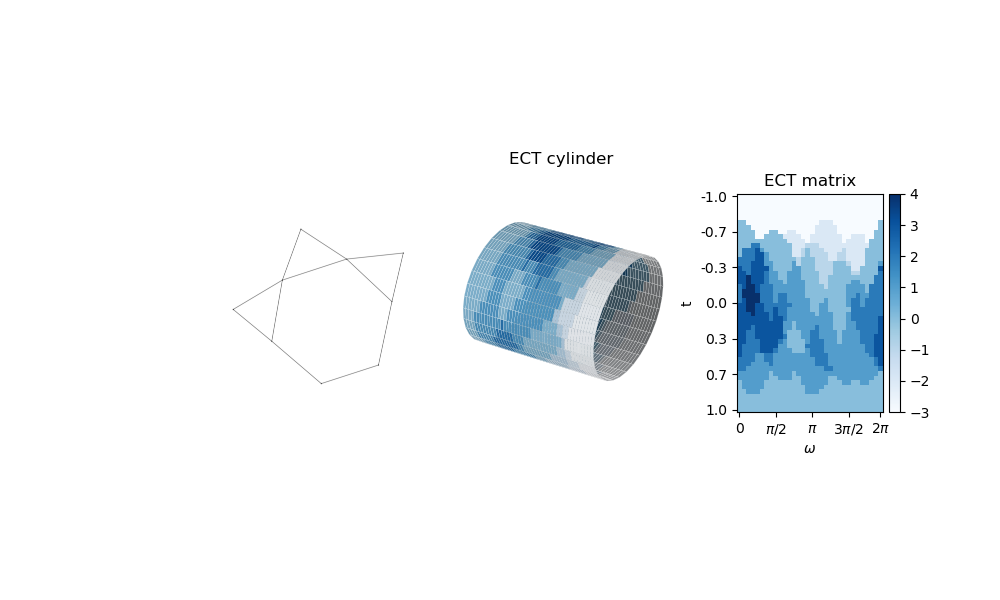

In [29]:
fig = plt.figure(figsize=(10,6))
gs = matplotlib.gridspec.GridSpec(1,3, width_ratios=(1.6, 1.6,1))
                           
ax1 = fig.add_subplot(gs[0,0])
im1 = ax1.imshow(outline)
ax1.set_aspect('equal')
ax1.set_axis_off()

ax2 = fig.add_subplot(gs[0,1], projection='3d')
surf = ax2.plot_surface(xs, y, z, facecolors = fcolors,linewidth=0.1)
surf.set_edgecolor('w')
ax2.set_title('ECT cylinder')
ax2.set_axis_off()

ax3 = fig.add_subplot(gs[0,2])
im3 = ax3.imshow(ect,origin='lower', cmap= 'Blues')
ax3.set_title('ECT matrix')
ax3.set_xlabel('$\omega$')
ax3.set_xticks([0, 8, 16, 24, 31]) 
ax3.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
ax3.set_yticks(ticks) 
ax3.set_yticklabels([f'{x:1.1f}' for x in tick_labels])
ax3.set_ylabel('t')
plt.colorbar(im3, ax=ax3,fraction=0.067, pad=0.04)

#plt.tight_layout()

box = ax1.get_position()
box.x0 = box.x0 + 0.07
box.x1 = box.x1 + 0.07
ax1.set_position(box)


# Crown graph rotation still Figure

In [30]:
plt.style.use('default')
%matplotlib inline

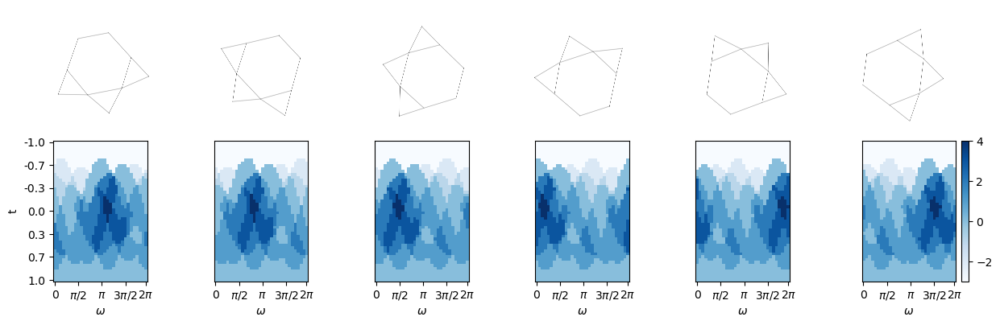

In [31]:
num_rotations = 6
fig = plt.figure(figsize=(15,10))
gs = matplotlib.gridspec.GridSpec(2,num_rotations, height_ratios=[3,1])

for i in range(num_rotations):
    r = [int(50/6) * j for j in range(6)]
    input_filedir = '../data/ALLleaves_ECT_graph_rotation/rotation' + str(r[i])
    outline = cv2.imread(input_filedir+'.png') 
    ect = np.load(input_filedir+'.npy')
    
    #ax= fig.add_subplot(2,num_rotations,i+1)
    ax= fig.add_subplot(gs[0,i])

    im = ax.imshow(outline)
    ax.set_aspect('equal')
    ax.set_axis_off()
    
    #ax2 = fig.add_subplot(2,num_rotations,i+num_rotations+1)
    ax2 = fig.add_subplot(gs[1,i])
    im2 = ax2.imshow(ect, origin='lower',cmap = 'Blues')
    #ax2.set_title('ECT matrix')
    ax2.set_xlabel('$\omega$')
    ax2.set_xticks([0, 8, 16, 24, 31]) 
    ax2.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
    if i==0:
        ax2.set_ylabel('t')
        ax2.set_yticks(ticks) 
        ax2.set_yticklabels([f'{x:1.1f}' for x in tick_labels])
        
    else:
        ax2.set_yticks([])
    if i==5:
        plt.colorbar(im2, ax=ax2,fraction=0.067, pad=0.04)

    box = ax.get_position()
    box.y0 = box.y0 - 0.25
    box.y1 = box.y1 - 0.25
    ax.set_position(box)
    
plt.savefig('figures/crown_rotate_translate.png', dpi=1000, bbox_inches='tight')


[0, 8, 16, 24, 32, 40]
[ 0.          7.83333333 15.66666667 23.5        31.33333333 39.16666667
 47.        ]
[-2.9        -1.93333333 -0.96666667  0.          0.96666667  1.93333333
  2.9       ]
0.0 6.0
0.0 6.0
0.0 4.0
0.0 4.0
0.0 5.0
0.0 5.0


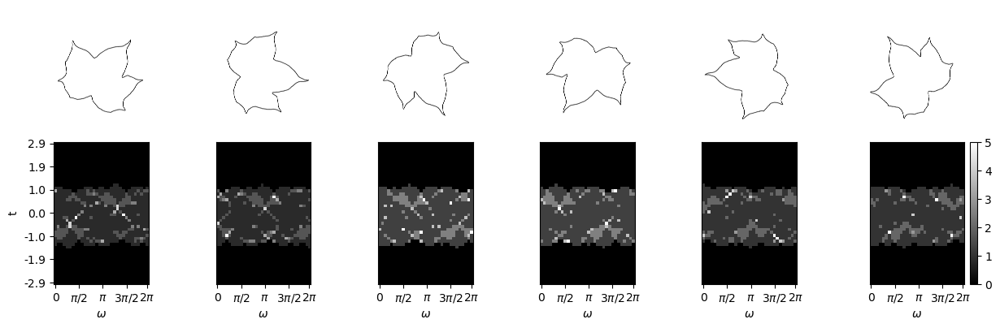

In [63]:
num_rotations = 6
fig = plt.figure(figsize=(15,10))
gs = matplotlib.gridspec.GridSpec(2,num_rotations, height_ratios=[3,1])

r = [int(50/6) * j for j in range(num_rotations)]
print(r)
rad = 2.9
ticks = np.linspace(0,47,7)
tick_labels = np.linspace(-rad,rad,7)
print(ticks)
print(tick_labels)

for i in range(num_rotations):
    
    input_filedir = '../data/ALLleaves_ECT_Cotton_rotation/rotation' + str(r[i]+2)
    outline = cv2.imread(input_filedir+'.png') 
    #ect = rescale(np.load(input_filedir+'.npy'))
    ect = np.load(input_filedir+'.npy')
    print(ect.min(), ect.max())
    #ax= fig.add_subplot(2,num_rotations,i+1)
    ax= fig.add_subplot(gs[0,i])

    im = ax.imshow(outline)
    ax.set_aspect('equal')
    ax.set_axis_off()
    
    #ax2 = fig.add_subplot(2,num_rotations,i+num_rotations+1)
    ax2 = fig.add_subplot(gs[1,i])
    im2 = ax2.imshow(ect, origin='lower', cmap = 'gray')
    #ax2.set_title('ECT matrix')
    ax2.set_xlabel('$\omega$')
    ax2.set_xticks([0, 8, 16, 24, 31]) 
    ax2.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
    if i==0:
        ax2.set_ylabel('t')
        ax2.set_yticks(ticks)
        ax2.set_yticklabels([f'{x:1.1f}' for x in tick_labels])
    else:
        ax2.set_yticks([])
    if i==5:
        plt.colorbar(im2, ax=ax2,fraction=0.067, pad=0.04)

    box = ax.get_position()
    box.y0 = box.y0 - 0.25
    box.y1 = box.y1 - 0.25
    ax.set_position(box)
    
plt.savefig('figures/cotton_rotate_translate.png', dpi=1000, bbox_inches='tight')


In [552]:
#transform images
regtransform = transforms.Compose([transforms.ToTensor(),transforms.Normalize(0.5,0.5)])


(0, 255)

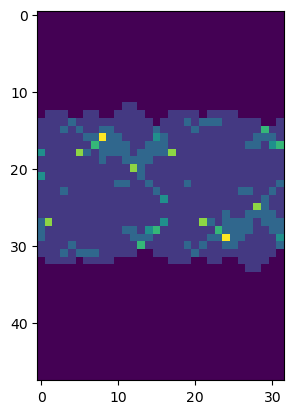

In [580]:
filedir_ect = '../data/ALLleaves_ECT_Cotton_rotation/rotation' + str(41)+'.npy'
ect = rescale(np.load(filedir_ect))

plt.imshow(ect)
ect.min(), ect.max()

(tensor(-1.), tensor(1.))

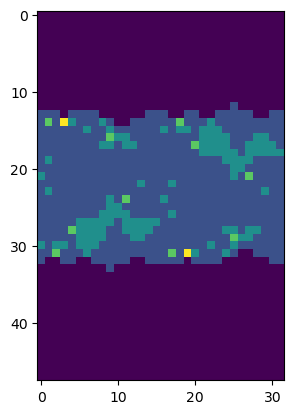

In [575]:
test = regtransform(ect)
plt.imshow(test[0,:,:])
test.min(), test.max()

In [195]:
from PIL import Image

image_path_IM = '../data/ALLleaves_images_small'

numpy_data=[]
numpy_target=[]
for path, subdirs, files in os.walk(image_path_IM):

    files = [f for f in files if not f[0] == '.']
    subdirs[:] = [d for d in subdirs if not d[0] == '.']

    for name in files:
        print(path)
        input_filedir1 = os.path.join(path, name)
        print(input_filedir1)
        imageIM = np.array(Image.open(input_filedir1).convert('L'))#Converting to grayscale, using only 1 channel

        end = os.path.join(path[31:], name[:-3]+'npy')
        input_filedir2 = os.path.join(path[:18]+'ECT', end)
        imageECT = np.load(input_filedir2) #load the ECT image (single channel)
        
        
        print(imageIM.shape, imageECT.shape)
        image = np.stack((imageIM, imageECT,imageECT),axis=0)
        print(image.shape)
        numpy_data.append(image)

../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5022_4084.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3217_2_3279.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7215_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13023_15.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2263_1263.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3094_1470.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13108_2214.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1312_119.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_ima

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8318_94.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6146_248.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9267_1289.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/12019_1580.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2045_2459.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5219_4417.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10178_2_41.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3097_305.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_sma

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1008_159.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1127_1247.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3171_3180.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11245_4441.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2212_1210.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6058_3461.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1146_601.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13066_2103.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_s

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1181_2_933.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6101_4664.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11174_349.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13128_2269.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11294_1315.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3041_2953.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11200_1166.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8030_2_1855.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_im

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1265_993.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1106_183.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3313_2_3417.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1100_677.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11012_118.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10133_2_3970.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3251_1640.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3349_2_2595.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_imag

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7105_116.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9207_348.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10031_3837.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3257_2_32.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1281_1918.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6119_2_171.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5222_4432.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8286_2_796.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11263_2_490.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9201_2_2389.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8087_1922.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2234_1230.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8177_613.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8100_2_1952.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10128_246.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11044_791.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_ima

(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11227_2_1209.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5096_2_146.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10286_435.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13066_2110.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13066_2104.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1239_1797.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5250_2_3327.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4187_2850.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3242_1601.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2293_1283.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11068_231.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5150_4282.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1307_2135.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11068_219.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4178_3802.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3244_2_1610.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5183_4370.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4085_3646.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1069_616.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4121_278.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3152_391.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11272_1253.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10307_465.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9060_968.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_smal

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1215_2_893.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3133_2_3098.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7105_2_109.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8079_2_444.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7308_313.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10310_4169.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13088_2189.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7293_2_1796.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6262_3668.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10055_2_97.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6143_231.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2152_42.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3293_2_3397.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5183_4367.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11059_4242.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1298_1965.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1031_2_477.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4094_2_215.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/12074_2_823.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9150_208.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9033_2_925.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10331_514.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3193_444.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11038_759.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_image

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8213_2042.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11161_334.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7246_1739.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11125_295.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13040_2_4689.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6101_2_4658.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11278_511.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6322_12.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_image

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8018_76.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9150_222.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4337_2_4023.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8159_2022.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5003_3056.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1190_1518.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9033_2_927.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8249_735.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_sm

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3166_2_1524.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2014_2401.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7284_287.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11161_338.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6320_4956.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13037_2_2062.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8189_2_643.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1286_2_1925.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_i

(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11151_1046.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13086_2_2171.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1265_2_1879.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9079_2_2241.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1001_34.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10274_2_156.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2009_1050.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2198_2_1180.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/App

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13091_2_2193.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/12080_1700.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7284_286.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2014_2400.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9062_2231.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8261_744.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13040_2_4684.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7314_2_1828.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_i

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10154_4010.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2194_2700.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1220_2_1746.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4187_2_2840.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1218_1020.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2151_2636.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1163_635.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8070_2_185.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_ima

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5072_4183.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10248_124.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11005_693.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4337_4032.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11071_4258.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9300_2446.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9084_1027.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3199_2_3245.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_image

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11284_1293.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9132_2309.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5318_4562.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9324_2_2512.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7038_2_204.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10292_455.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2074_2_1094.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3107_3059.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_im

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1014_703.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1296_1948.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1166_2_896.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3149_3149.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10341_2_4185.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9225_1225.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13110_4773.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9088_161.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_image

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11017_2_4206.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6295_4925.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7246_2_1737.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4005_2613.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11080_2_4276.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4193_2_2855.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7215_11.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10083_174.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1083_658.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3091_2_1455.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5214_306.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9039_945.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5214_312.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9213_2_1195.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8108_511.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11251_4451.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_s

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/12058_1679.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3034_1393.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4187_2849.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4239_2_3847.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10286_438.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4209_2881.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2322_1322.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8246_286.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3307_2590.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3041_2959.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2311_180.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3232_2_3309.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10007_14.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11118_2_937.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4193_328.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1260_990.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_s

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5096_2_148.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3034_1390.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4209_2882.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11020_718.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5055_87.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2110_2573.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10265_4129.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9066_992.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_sm

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4062_146.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2341_2899.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4055_2687.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11167_2_1113.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8237_2066.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8111_2_1962.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11155_302.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4019_2_2630.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_im

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7092_1667.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11086_2_863.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1215_1008.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10085_186.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5156_4300.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6265_3677.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/2287_2_2824.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3128_2_3085.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_im

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10049_2_3877.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5153_2_234.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4256_2_3894.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/8143_535.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10262_2_400.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9213_1203.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/4092_2_2724.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3013_1365.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7092_1670.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3173_424.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10085_185.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6028_76.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11213_2_4388.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/5063_114.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11032_4217.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/6028_62.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_sma

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/10121_3952.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/7251_2_1748.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/1155_2_1455.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/9310_2468.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/11263_2_498.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/13130_2282.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3295_2_2561.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Apple
../data/ALLleaves_images_small/Apple/3044_2_2973.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLlea

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pten3_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Ptri5_21.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Ptlo4_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmis6_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pker2_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmal2_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pbif_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcor

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pbif3_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmal4_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pgra2_13.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Ptlo2_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcri3_11.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmol5_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Phat4_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pe

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmis6_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pnit4_11.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcor8_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pten3_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pbif_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pbif5_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Psid4_11.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Psu

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pala6_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcoc5_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Prac6_15.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Porg1_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pala5_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pvil1_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcoc2_15.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/P

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmin6_13.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Prub6_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Prac4_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pedm5_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Plig1_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcor12_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmic1_11.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcin1_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pedm1_12.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pedm1_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcap6_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Plig5_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pset5_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pedu3_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pac

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pset4_17.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Plig5_12.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcor9_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmin3_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Ptlo5_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pfoe4_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pbif4_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pa

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pten1_14.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Prub5_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Phat5_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmie7_14.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmol4_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pame4_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmis4_25.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/P

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Ptri5_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmin3_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pset4_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Ptlo5_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pfoe4_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmal3_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmic1_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Psi

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmol3_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcri6_11.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pgra2_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pcri1_18.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pgib2_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Psub2_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmis8_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pm

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Ptlo2_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Ptri7_15.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Ptri2_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Psid1_15.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Psub13_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Ppoh1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/Pmaf1_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Passiflora
../data/ALLleaves_images_small/Passiflora/P

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine39_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine39_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine1_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine30_20.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine4_11.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine3_18.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine13_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine3_24.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine21_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine12_21.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine15_14.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine24_20.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine18_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine6_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine23_15.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine23_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_sma

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine25_18.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine33_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine15_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine8_20.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine1_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine6_19.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine27_21.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_small/Ivy/Vine28_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Ivy
../data/ALLleaves_images_smal

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/060_6_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/118_6_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/070_6_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/036_3_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/108_6_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/021_8_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/060_2_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/110_4_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/077_9_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/067_9_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/035_6_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/103_5_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/084_3_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/051_8_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/113_6_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/025_5_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/035_5_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/103_6_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/053_3_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/015_6_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/086_8_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/044_8_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/099_5_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/091_3_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/033_2_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/075_7_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/024_9_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/034_9_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/020_3_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/066_6_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/006_6_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/048_5_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/095_8_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/057_8_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/082_3_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/047_8_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/076_5_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/038_6_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/116_3_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/066_5_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/028_6_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis/102_9_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis
../

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/32_right007.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/22_left066.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/15_right018.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/36_right033.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/63_right033.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_s

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/27_right002.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/32_left065.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/17_left045.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/14_right019.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/32_left067.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_sma

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/17_right062.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/54_left065.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/56_right064.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/71_left047.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/54_left059.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_sma

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/22_right052.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/62_left035.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/44_right063.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/11_right063.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/28_left065.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_sm

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/52_left032.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/58_right016.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/21_left041.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/43_left067.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/12_right064.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_sma

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/12_right063.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/16_right057.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/12_left029.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/43_right057.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/57_right051.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_s

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/12_right006.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/47_right006.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/43_left005.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/21_left023.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/15_left054.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_sma

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/27_right036.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/23_left038.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/17_left067.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/72_right036.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/75_left041.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_sma

(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/22_left068.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/33_left001.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/16_left037.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/51_left027.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry/54_right010.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Arabidopsis/Arabidopsis_asymmetry
../data/ALLleaves_images_small/Arabidopsis/Arab

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Apluda_mutica_0002_Layer_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Tristachya_0002_Layer_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Rhynchoryza_0000_Layer_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Elymus_canadensis_b__0004_Layer_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Lolium_0008_Layer_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Arthrostylidium_pubescens_0000_Layer_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Bromus_pubescens_b_0002_Layer_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLle

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Diandrolyra__0001_Layer_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Dissochondrus_0000_Layer_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Melica_nitens_0006_Layer_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Monachather_0000_Layer_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Eriochloa_ZCYD.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Eleusine_bvnj.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLleaves_images_small/Grass/Otatea_acuminata_0002_Layer_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grass
../data/ALLle

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M193_D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M34_A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M173_A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M71_A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M136_A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M57_B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M110_B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/138_t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato


(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/179_t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M53_B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M114_B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M16_B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M151_B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/184_t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/93_c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/184_c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M56_B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M111_B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/203_a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/161_b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M149_T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/124_b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/9_c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/102_a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../d

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M61_C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M163_C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M24_C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/128_a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M61_T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M126_T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M24_T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M163_T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
.

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M106_T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M143_T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/3_t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/39_b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M106_C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M41_C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M143_C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/170_a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M206_C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/109_a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/2_c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M142_T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/2_t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M142_C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M99_B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../data/ALLleaves_images_small/Potato/M204_A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Potato
../d

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/j6_AB_counterclock119.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/c2_AB_counterclock111.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/l12_AB_clock071.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/j8_AB_counterclock123.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/l1_AB_counterclock049.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/i11_AD_counterclock128.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/q3_AB_counterclock113.p

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/j10_AD_counterclock126.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/f4_ADcounter_clock018.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/m12_AB_clock071.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/h5_AD_counterclock116.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/a11_AB_counterclock129.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/l2_ADcounter_clock014.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/j2_AD_clock024.png
(48

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/m5_ADcounter_clock020.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/d7_AD_clock148.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/j18_AD_clock082.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/j4_AD_counterclock054.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/i19_AB_clock085.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/o13_AB_counterclock133.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/p5_AB_clock033.png
(48, 32) (48, 32)

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/b3_AB2_clock029.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/n22_AD_clock090.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/p10_AB_clock043.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/k15_AD_clock076.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/d27_AD_counterclock100.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/c25_AB_counterclock097.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/u3_AD1_clock026.png
(48, 32) (48, 32)
(3

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/j4_AD_counterclock114.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/m1_ADcounter_clock012.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/h3_AB_counterclock053.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/k9_AD_clock040.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/h7_AB_counterclock121.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/l9_AD_counterclock124.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/c5_AD_clock032.png
(48, 3

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/g14_AD_counterclock162.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/d25_AB_counterclock097.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/c27_AD_counterclock100.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/c19_AB_clock085.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/a2_ABcounter_clock015.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/s3_ABcounter_clock017.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/a17_AB_clock081.png
(

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/b3_ADcounter_clock016.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/i19_AD_clock173.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/c11_AB_counterclock129.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/b16_AB_clock079.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/m12_AB_counterclock131.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/m3_ADcounter_clock016.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Alstroemeria
../data/ALLleaves_images_small/Alstroemeria/m20_AB_clock087.png
(48, 32)

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/547a_1158a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/237b_736a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/266a_807c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/274b_1083b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/178b_1088b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/414a_1337a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/164b_1143a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/429a_1054b.png
(48, 32) (48, 32)
(3, 48, 32)
../d

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/590a_727a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/695b_788b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/509a_1758a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/133b_1125b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/68a_1177a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/216a_749a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/250a_795a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/574b_895a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/677b_792b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/221b_755b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/369b_1259a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/38a_1311b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/260a_695b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/491a_1837b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/467a_1844b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/660a_760b.png
(48, 32) (48, 32)
(3, 48, 32)
../data

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/596a_720a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/686a_1026b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/601c_717a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/224a_733b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/578a_890a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/278a_1099b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/9b_851b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/431a_1057b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/A

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/103a_902b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/693b_1329a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/643b_994a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/639b_886a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/443a_1048a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/505a_1805a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/158b_1127a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/340a_947b.png
(48, 32) (48, 32)
(3, 48, 32)
../dat

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/13a_854b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/442a_1058b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/328a_1215b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/254b_677c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/461b_1104b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/121a_1005b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/125a_992a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/14b_856a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/

(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/312a_1238b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/144b_1129b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/123b_1000b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/134b_1126a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/248a_797a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/190a_1034d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/393b_1308a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/565a_1159a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_ima

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/164a_1143b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/178a_1088a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/274a_1083a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/366a_1262d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/414b_1337b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/213b_756b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/547b_1158b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/447b_1118a.png
(48, 32) (48, 32)
(3, 48, 32)
../

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/54a_962a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/284a_1084b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/220a_745a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/532b_826b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/131b_1121b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/96a_922a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/501a_1829b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Cotton
../data/ALLleaves_images_small/Cotton/211a_687a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/A

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/molle_167_2000_B_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/bracteatum_229_98_A_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/lepidotulum_How_72851_mm_dd_1935_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/sieboldii_616_6_A_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/rufidulum_21418_A_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/hupehense_80_81_B_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/opulus_352_78_E_10.png
(4

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/lobophyllum_1166_83_A_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/hupehense_1985_80_C_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/prunifolium_1189_85_B_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/bitchiuense_1797_77_A_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/lobophyllum_1875_80_A_14.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/hupehense_1948_80_B_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/rhytidophyllum_1387_82

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/cassinoides_18_79_A_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/veitchii_101_81_B_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/rafinesquianum_365_84_A_12.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/lepidotulum_Tsang_24600_11_03_1934_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/cassinoides_892_61_A_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/dilatatum_821_85_C_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V1
../data/ALLleaves_images_small/Viburnum/V1/rhytidophyllum

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/inopinatum_Averyanov_5063_04_14_2000_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/henryi_23_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/schensianum_Hers_1231_09_23_1919_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/corylifolium2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/lutescens_9_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/formosanum_5_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/farreri_2_9.png
(48, 32) (48, 32)
(

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/caudatum_Donoghue_38a_08_29_1974_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/parvifolium_1_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/hartwegii_Stevens_11703_01_14_1979__5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/formosanum_4_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/davidii_5_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/tinus_Godet_NA_mm_dd_yyyy_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/erubescens_k11.png
(

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/sympodiale_Bartholomew_1287_09_14_1980_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/henryi_8_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/colebrookeanum_Fukuoka_T62186_07_23_1988_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/inopinatum_Maxwell_951252_12_03_1995_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/ternatum_Wang_23138_07_01_1931_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/adenophorum9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_sm

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/luzonicum_3_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/farreri_2_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/erosum_v_taquetii_1_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/nervosum_11_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/japonicum_Seto_26279_11_06_1983_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/brachybotryum_22_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Viburnum/V2
../data/ALLleaves_images_small/Viburnum/V2/flavescens_2_2.png
(48, 32) (48, 32)
(3, 48, 32)


(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/588584a_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/483190b_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/483180b_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/483157a_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/588648b_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Gr

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/588457c_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/588683a_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/594344a_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/588457a_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/588638b_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Gra

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/483184a_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/588476a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/588718a_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/588643a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016/588718a_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/Dan_Geneva_2016
../data/ALLleaves_images_small/Grap

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588225_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588262_b_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588229_a_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588182_b_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/279897_a_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Genev

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588134_b_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588222_b_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588219_a_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588395_a_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/483169_b_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Gen

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588273_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588149_a_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588261_b_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588219_a_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588257_b_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Gene

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588404_b_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588134_c_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588138_a_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/588128_a_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016/483161_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2016/MF_Geneva_2016
../data/ALLleaves_images_small/Grape/Gene

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/10_B_3_b_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/14_B_4_b_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/08_B_4_b_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/14_C_4_a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/11_A_2_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/12_B_4_b_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/08_G_1_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/08_F_2_a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/09_D_3_a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/13_H_3_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/16_A_2_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/15_G_1_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/14_D_3_a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/10_D_4_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2014_MtVernon_Scans/09_G_2_b_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/11_G_2_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/14_E_4_a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/8_A_4_a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/16_H_3_b_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/8_H_1_b_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_sm

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/15_B_3_a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/11_B_4_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/9_A_2_b_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/8_C_3_b_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/15_E_2_b_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_sm

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/9_B_3_b_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/14_C_3_a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/15_A_2_a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/10_C_4_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/16_G_1_a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_s

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/12_H_1_b_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/9_D_1_b_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/13_D_4_b_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/16_F_2_b_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans
../data/ALLleaves_images_small/Grape/MtVernon_scans/2016_MtVernon_Scans/11_D_3_a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_s

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588214a_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588174a_13.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588152a_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588307b_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588369a_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588269a_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/G

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588182a_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588335a_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588272b_11.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588269a_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588564a_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588155a_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Gr

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588395a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588188a_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588186a_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588208b_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588352a_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060815
../data/ALLleaves_images_small/Grape/Geneva_2015/060815/588167a_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Gra

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/483190a_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588634c_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/483161a_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/483168a_9.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588540b_12.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588271a_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Gr

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588631b_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588630a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588643a_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588372a_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588329a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/483152b_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Gra

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/483187a_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588194a_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588529a_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/588647a_6.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/483160b_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/060915
../data/ALLleaves_images_small/Grape/Geneva_2015/060915/483166a_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Gra

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/061015
../data/ALLleaves_images_small/Grape/Geneva_2015/061015/588583b_5.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/061015
../data/ALLleaves_images_small/Grape/Geneva_2015/061015/588454b_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/061015
../data/ALLleaves_images_small/Grape/Geneva_2015/061015/588633b_8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/061015
../data/ALLleaves_images_small/Grape/Geneva_2015/061015/588632a_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/061015
../data/ALLleaves_images_small/Grape/Geneva_2015/061015/588641a_7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2015/061015
../data/ALLleaves_images_small/Grape/Geneva_2015/061015/588679a_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Gra

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny/483187a_5T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny/588141a_4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny/588123a_10N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny/588144a_4N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny/483187b_11C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder3_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/F

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2/588460a_9C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2/588457c_15N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2/588483b_16N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2/588456a_6N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2/588564b_7N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder8_Susan2
../data/ALLleaves_images_small/Grape/Ge

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny/w2_588592a_5N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny/w2_588589c_13C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny/w2_588445a_3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny/w2_588448b_12N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny/w2_588055a_11N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder12_Danny
../data/ALLleaves_image

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren/588346a_12C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren/588350a_5T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren/588331a_11N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren/588324b_10C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren/588371b_8C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder6_Darren
../data/ALLleaves_images_small/Grape/G

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy/483172b_8T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy/483169b_14C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy/483168a_4N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy/483162b_8C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy/483174a_8T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder2_Tommy
../data/ALLleaves_images_small/Grape/Geneva_2013/Fo

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha/588205a_9C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha/588190b_8T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha/588167c_9N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha/588147a_2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha/588201a_8N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder4_Quaneisha
../data/

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2/588440c_12C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2/588373a_1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2/588435b_8T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2/588439a_2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2/588448a_4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder7_Jose2
../data/ALLleaves_images_small/Grape/Geneva_2013/Fo

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2/588685a_9N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2/588711a_4N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2/594349a_1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2/597293a_5C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2/588710a_6T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder11_Darren2
../data/ALLleaves_i

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose/313922a_1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose/279897a_4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose/483149b_11C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose/271662a_5N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose/318684b_10C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder1_Jose

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2/588635a_5T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2/588635c_11C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2/588630a_5N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2/588586c_15N.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2/588636a_3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Geneva_2013/Folder9_Tommy2
../data/ALLleaves_images_small/Grape/Ge

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay29.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay29.2011/K1514B_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay29.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay29.2011/L0770A_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay29.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay29.2011/K1243A_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay29.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay29.2011/K1320A_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay29.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay29.2011/L0715B_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grap

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay31.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay31.2011/L1833B_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay31.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay31.2011/K0964B_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay31.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay31.2011/K1108A_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay31.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay31.2011/L0147B_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay31.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay31.2011/L0274A_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grap

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay30.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay30.2011/L0452B_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay30.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay30.2011/K0556B_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay30.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay30.2011/K1478B_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay30.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay30.2011/L1842B_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay30.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeMay30.2011/K1435A_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grap

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeJune1.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeJune1.2011/K0201A_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeJune1.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeJune1.2011/K0870A_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeJune1.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeJune1.2011/K0219B_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeJune1.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeJune1.2011/K0813A_1.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeJune1.2011
../data/ALLleaves_images_small/Grape/Domesticated_grape/GrapeJune1.2011/L1564A_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Grap

(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/194_1_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/298_1_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/184_1_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/314_1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/070_2_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/398_2_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/388_2_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../d

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/185_1_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/315_1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/299_1_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/305_1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/195_1_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/289_1_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/073_1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/B

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/img022_1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/010_2_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/280_2_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/112_2_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/012_1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/282_1_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/292_1_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_smal

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/img027_1_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/209_1_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/115_1_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/371_1_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/385_1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/219_1_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/361_1_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_smal

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/203_1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/213_1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/083_1_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/177_2_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/075_2_2.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/379_2_4.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/napus
../data/ALLleaves_images_small/Brassica/napus/165_1_3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/B

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/rapa
../data/ALLleaves_images_small/Brassica/rapa/Sample_60.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/rapa
../data/ALLleaves_images_small/Brassica/rapa/Sample_74.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/rapa
../data/ALLleaves_images_small/Brassica/rapa/Sample_128.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/rapa
../data/ALLleaves_images_small/Brassica/rapa/Sample_114.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/rapa
../data/ALLleaves_images_small/Brassica/rapa/Sample_100.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/rapa
../data/ALLleaves_images_small/Brassica/rapa/Sample_101.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Brassica/rapa
../data/ALLleaves_images_small/Brassica/rapa/Sample_115.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_sm

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_63_4_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_52_14_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_62_4_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_4_09.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_64_11_01.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_43_13_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_45_16_09.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_62_13_03.png
(48, 32) (48, 32)
(3, 48, 32)
../da

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_42_7_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_40_16_01.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_16_09.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_42_7_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_50_17_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_11_14.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_41_10_03.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_48_13_01.png
(48, 32) (48, 32)
(3, 48, 32)
../d

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_52_3_01.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_43_5_03.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_13_07.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_40_14_06.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_42_5_03.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_13_13.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_50_15_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_9_17.png
(48, 32) (48, 32)
(3, 48, 32)
../dat

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_65_11_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_64_6_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_43_15_03.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_65_6_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_55_16_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_62_15_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_48_6_08.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_45_10_08.png
(48, 32) (48, 32)
(3, 48, 32)
../da

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_55_1_03.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_40_12_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_58_18_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_44_9_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_15_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_45_9_10.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_52_5_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_58_16_01.png
(48, 32) (48, 32)
(3, 48, 32)
../dat

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_45_5_09.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_42_8_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_50_18_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_48_12_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_41_11_06.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_54_4_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_59_15_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_42_1_08.png
(48, 32) (48, 32)
(3, 48, 32)
../dat

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_41_7_01.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_57_5_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_60_13_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_37_15_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_56_18_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_37_15_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_60_13_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_57_5_03.png
(48, 32) (48, 32)
(3, 48, 32)
../da

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_45_18_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_42_12_01.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_38_4_01.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_63_3_04.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_65_10_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_38_3_08.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_4_15.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_4_01.png
(48, 32) (48, 32)
(3, 48, 32)
../data

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_8_17.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_38_8_03.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_64_5_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_38_6_06.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_42_10_06.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_39_6_12.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_65_12_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_63_1_03.png
(48, 32) (48, 32)
(3, 48, 32)
../data/

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_38_10_01.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_53_6_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_44_4_12.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_48_14_02.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_38_17_08.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_45_4_06.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_52_6_05.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Pepper
../data/ALLleaves_images_small/Pepper/L_51_16_04.png
(48, 32) (48, 32)
(3, 48, 32)
../dat

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L3_EJ7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L1_EI15.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L3_EB11.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L2_EB11.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L1_EK17.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L1_EE18.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomat

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L2_EJ15.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L2_EH7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L1_EC13.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L2_EG8.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L2_EB3.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_entire/L2_EC7.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_entire
../data/ALLleaves_images_small/Tomato/Tomato_e

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_L_L310.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_R_R406.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf3_R_R82.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_L_L304.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf2_R_R193.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_R_R348.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tom

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf3_R_R348.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf3_R_R406.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf3_L_L304.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf4_L_L175.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf3_L_L310.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf4_L_L388.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/To

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_L_L218.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_R_R81.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_R_R268.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_L_L224.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_R_R240.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf4_L_L194.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tom

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_L_L221.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_L_L235.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf4_L_L185.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_R_R251.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf3_R_R384.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf1_R_R84.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tom

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf3_R_R131.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf4_L_L318.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf3_R_R119.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf3_L_L169.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf2_R_R13.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry
../data/ALLleaves_images_small/Tomato/Tomato_asymmetry/lf4_R_R368.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tom

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE4B1xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF5C2xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE2D2xA2a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF4B2xB3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA5A2xB4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE4C1xA2c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB4D1xA3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE1B1xA3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA5A1xB3d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB2B2xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE5C2xB4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE3D1xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE6D1xA1c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA5A2xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE2D2xB4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE6A2xB3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB5A1xB3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA4D1xA2b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB3D1xB3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF5A1xB4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA5B1xA2a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB5C2xB3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB2A2xB3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA3D2xA2c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF5B2xA2c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA6C1xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE3D2xB3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE4B1xA1b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB6B2xB3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF5C2xA2c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF1A1xA3b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF2B2xB4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB2A2xB4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE2C2xA1t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB5B2xB4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB3D1xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE4C2xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF5C1xA3b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA1A2xA1a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE3D1xB3d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE4B2xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB1D2xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF3D1xB3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA6B1xB3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF2D1xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE5C1xA2a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF2A2xB3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF1B1xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA5A2xB3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF4B2xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB3C2xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF6D1xB3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA3B1xB3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF1B2xA1b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA1A2xB4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA3C1xB3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE6D2xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE3A2xB4d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA5A1xA1c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB3B2xA2a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tom

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF1C2xB4b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA1D1xB3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF3D2xA1b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA2C1xB4b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF2D2xB3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB1D2xA2c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA4D1xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE2D2xB3d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF1B1xA4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA6C1xB3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF5B2xB3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA4A2xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE6D1xB3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE2A1xB4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB2B1xA2D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB5D2xB3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE4B1xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB5A1xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA4B1xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF5A1xB3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA2D2xB4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA6A2xB3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA4C1xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE5A2xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF3B1xB4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA4C1xA2b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB1C1xB4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB3D1xA1a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE6B1xA1t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB4B2xB3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA6A2xB3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE6C1xB4d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA2D2xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF1D1xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB5C2xB4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF5A1xB3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE1A2xA2b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA3D1xB3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB2A1xA2b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF1D2xA3b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA1C1xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA3A2xA3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE5A1xA1a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF4D1xB3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB2D2xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB6A2xA1a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB6D1xB3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF3C2xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF2B1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF1A2xB4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HA1B2xA2a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1HB4B2xB4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB1C1xB3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HF4D2xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE4B2xB3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UF1B2xA4d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE2D1xB3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE6A1xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE5B2xA1b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3UE4C2xB3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB4A1xB4b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UA1A1xA2a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE4C1xA1t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE6D1xB4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_1UB6C2xB3b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C1/C_3HE3A1xA2d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB2B1xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE4B2xB3b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB5B1xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE4D1xA4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB5B1xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB6D1xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF3D1xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB6C1xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE2D2xA3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA1D1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB4B2xA3A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB1C1xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF1B1xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA3C1xA2D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA4A1xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF3A2xA4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA6B2xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB4D1xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA4D1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB4A1xA1A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA2B2xA2C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB3B1xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF2A1xA4d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB4B1xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA3B2xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB1D1xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF4C1xA1t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA6B1xA2D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF4C1xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA3C2xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB1B2xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB1B2xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE4A2xA1t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE3A2xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB6B2xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA1D2xA4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB4C1xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB6A2xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF1D1xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE3B2xA4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB2D2xA3A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA2D2xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF1C2xA1A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE6D2xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF6A2xA3b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA6C1xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF5B1xB4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA3B2xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE6A1xA4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE4C2xA3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE2A2xB3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB4A1xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE1B1xA4b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB6B2xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA1A2xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA1A2xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF4B2xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA5D2xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE1C2xB4d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA3C1xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE4C1xA4b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE1B2xA3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UAGD1xA3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA2B1xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB3C2xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA4D2xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA1C1xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB2A1xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB6D1xA1A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF3C1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF5A1xB2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE4D1xA1b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF6B1xA2b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA4B1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB2A2xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE1D1xA1a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE3C1xB4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF6C1xA2b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF3D2xA2b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF5B1xA3d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE4C2xA1a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB6B2xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA2B2xA4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE3A2xA1b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF2D2xA4d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF1C2xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE6D2xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB2C1xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF6A2xA2b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA3B2xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF2A1xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB1A1xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB5D1xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE1C2xA3b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB5D1xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB6B1xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA3C1xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF3A2xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA6B2xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF4B2xA3a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA5D2xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE2A1xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB5A2xB4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB6B1xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE4C1xA1a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF5B2xA3d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA1D1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB6C1xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE4B2xB3b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB2B1xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA6B1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE5B2xA3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF3A1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA1A1xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UF5C1xA4b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA5A2xA3A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB3B1xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA1D2xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UB6C2xA4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF6D1xA3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA6A2xA3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE5A1xA1b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA4B1xA4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HA1B2xA2C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB3D1xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HF4A2xA2C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tom

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB2D2xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7UA6D2xA1D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE6C1xA4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_7HB1B2xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6UE4A2xA3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C3/C_6HE3C2xA2d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD2A2xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF1C2xA3A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC6C2xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF4B1xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC4A1xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC4A1xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF2D1xB4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC2B2xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC1D2xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF6D2xA1A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD6A2xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF2A2xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC2D1xA3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC4B2xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF1A1xA3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE2A1xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE5B1xA3A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF3A2xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tom

(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE4B2xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD6A1xA3A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD5C1xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF1C1xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC6C1xA1A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE2A1xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tom

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF2B2xA3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE5D2xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF5A2xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE6C2xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC6D2xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD1A2xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD4B1xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC5A2xA3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE1B2xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC4D1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF1B2xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC5D2xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD6D1xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC3B2xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF1C1xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD5C1xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF3A2xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC4A2xA1A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC2B1xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF5B1xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD4C2xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC4D2xA3A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE1B1xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC5A1xA2D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF6A2xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF4B1xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD5C2xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC6C2xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE2A2xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE3D1xA3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF2A2xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD6A2xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC1D2xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC6C2xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF4B1xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF2D2xA2D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE6A1xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE2D1xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE4C2xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD4C2xA3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD3A2xA2C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE1B1xA2D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tom

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD3B2xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD4B2xA1A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF5C1xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC4D2xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF3D2xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD3A2xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC1D2xA2C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE4B1xA1A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF5C2xA3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF2A2xA2C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE2D2xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE6A2xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF5B2xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE3A1xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF2A2xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE1C2xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC1D2xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD6A2xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE6A1xA1A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE1C1xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE4B2xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE3A2xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD4C2xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE4C2xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF2C1xA2B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC5C1xA4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC6D1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF5A1xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF4D2xA3D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD6B1xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF4C1xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC5A1xB3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD5B2xA3A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC5D2xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD2A2xA3B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF6A2xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC2B2xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF2A2xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD2D2xA1A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE1C2xA2T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC1D2xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD6A2xA4T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD1A2xA2D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HE6C2xA4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UF2C2xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD6C2xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE5D2xA2A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE3C1xA2C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tom

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD4D2xA3A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UD5A1xA2D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD2C1xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9UE2C1xA4D.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC4B2xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF6C1xA1B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF4D2xA4C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_9HF2B1xA4A.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC5B1xA1T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HC5B1xA3C.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8HD3C2xA3T.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C4/C_8UC6D1xA4B.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JUA6D1xA4d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LUE5B2xA3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KUD5A1xA4d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHA5C1xA2a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LHE5B2xA1t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHB2D1xA1b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/c

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KUD1D2xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KHC6A2xA4b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LHF4C2xA4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHA6D2xA1a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LHF2D1xA4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHA2D1xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHA4D2xA4d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JUA1D1xA2c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KUD2A1xA2c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JUB3B2xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LUE4D1xA4b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHB1A1xA1t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHA5C2xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LUF3A2xA4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KUC1C2xA4b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KUC3A1xA3b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LUF1C1xA3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KHD4D1xA3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHA5B1xA3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHB3A2xA2a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KHC4C2xA4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LUF1C2xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KHD4D2xA4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LHE2A2xA2b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JUB6A2xA3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KHC6A2xA4d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JUB2D2xA4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHB6A2xA1t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KHC4C1xA3d.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LHE2A1xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LHF4B1xA3c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LUE5C2xA2b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KHC1B1xA1a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LHF6A2xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LUF2D2xA1a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KHD2B1xA4b.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHB1C2xA3t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JUB3D2xB4c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_LUE3D2xA4a.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KHD2B2xA2c.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_JHB3A1xA4t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5
../data/ALLleaves_images_small/Tomato/Tomato/chamber/C5/C_KHC4C1xA2t.png
(48, 32) (48, 32)
(3, 48, 32)
../data/ALLleave

KeyboardInterrupt: 

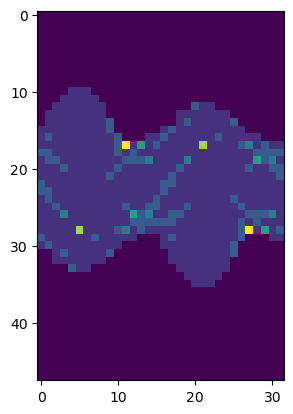

In [196]:
plt.imshow(image[2,:,:])

In [199]:
circledirs =  np.linspace(0, 2*np.pi, num=10, endpoint=False)
circledirs

array([0.        , 0.62831853, 1.25663706, 1.88495559, 2.51327412,
       3.14159265, 3.76991118, 4.39822972, 5.02654825, 5.65486678])

In [221]:
import random
 
# using random.sample()
# to generate random number list
res = [random.uniform(0, 2*np.pi) for i in range(10)]

In [222]:
res

[2.333331313700458,
 5.554051435165038,
 3.577458920997508,
 1.5928697390508135,
 5.129461196416488,
 2.9030558912083535,
 4.986069843120015,
 4.255363633872003,
 3.751233285788045,
 4.993321016309991]

In [230]:

labels = [ 0,  6,  1, 12, 11, 13,  1,  3,  5,  3, 12,  3,  9,  4,  9,  4]
unique_labels = np.unique(labels)
tmp = torch.from_numpy(np.concatenate([[i] * 10 for i in range(len(unique_labels))]))

In [233]:
print(tmp)

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7,
        7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9,
        9, 9, 9, 9])


In [232]:
training_reps = torch.stack([
    torch.cos(tmp / len(unique_labels) * 2 * torch.pi),
    torch.sin(tmp / len(unique_labels) * 2 * torch.pi),
]).T

In [234]:
training_reps

tensor([[ 1.0000e+00,  0.0000e+00],
        [ 1.0000e+00,  0.0000e+00],
        [ 1.0000e+00,  0.0000e+00],
        [ 1.0000e+00,  0.0000e+00],
        [ 1.0000e+00,  0.0000e+00],
        [ 1.0000e+00,  0.0000e+00],
        [ 1.0000e+00,  0.0000e+00],
        [ 1.0000e+00,  0.0000e+00],
        [ 1.0000e+00,  0.0000e+00],
        [ 1.0000e+00,  0.0000e+00],
        [ 8.0902e-01,  5.8779e-01],
        [ 8.0902e-01,  5.8779e-01],
        [ 8.0902e-01,  5.8779e-01],
        [ 8.0902e-01,  5.8779e-01],
        [ 8.0902e-01,  5.8779e-01],
        [ 8.0902e-01,  5.8779e-01],
        [ 8.0902e-01,  5.8779e-01],
        [ 8.0902e-01,  5.8779e-01],
        [ 8.0902e-01,  5.8779e-01],
        [ 8.0902e-01,  5.8779e-01],
        [ 3.0902e-01,  9.5106e-01],
        [ 3.0902e-01,  9.5106e-01],
        [ 3.0902e-01,  9.5106e-01],
        [ 3.0902e-01,  9.5106e-01],
        [ 3.0902e-01,  9.5106e-01],
        [ 3.0902e-01,  9.5106e-01],
        [ 3.0902e-01,  9.5106e-01],
        [ 3.0902e-01,  9.510

tensor([ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,
         5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,
         9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,
         9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,
         9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,
         9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,
         5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,
         5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,
        -8.7423e-08, -8.7423e-08, -8.7423e-08, -8.7423e-08, -8.7423e-08,
        -8.7423e-08, -8.7423e-08, -8.7423e-08, -8.7423e-08, -8.7423e-08,
        -5.8779e-01, -5.8779e-01, -5.8779e-01, -5.8779e-01, -5.8779e-01,
        -5.8779e-01, -5.8779e-01, -5.8779e-01, -5.8

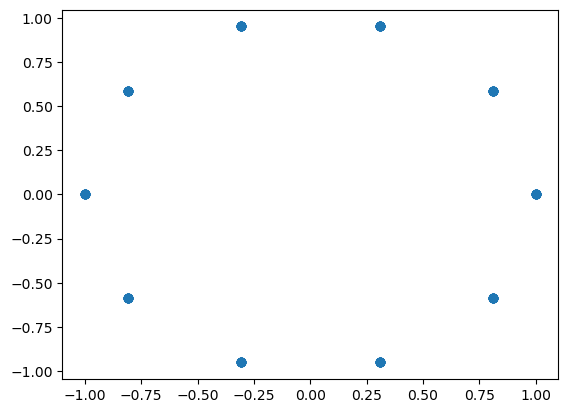

In [240]:
plt.scatter(training_reps[:,0],training_reps[:,1], label)

In [251]:
xbar = np.array([[-0.1574,  0.8708],
        [-0.6427,  0.0679],
        [-0.3994,  0.3979],
        [-1.3616, -0.0403],
        [ 0.0432,  0.3999],
        [-0.3774,  0.3190],
        [-0.0853, -0.3085],
        [-0.6974,  0.1098],
        [ 0.2366, -0.1960],
        [-0.5911,  0.5413],
        [ 0.2653,  0.0168],
        [-0.1826,  0.6940]])
x = np.array([[ 0.2225,  0.9749],
        [ 0.2225,  0.9749],
        [-0.2225, -0.9749],
        [ 0.2225, -0.9749],
        [ 0.9010,  0.4339],
        [-0.2225,  0.9749],
        [ 0.9010, -0.4339],
        [ 0.9010,  0.4339],
        [ 0.9010,  0.4339],
        [ 0.6235, -0.7818],
        [-0.6235,  0.7818],
        [ 0.2225,  0.9749]])

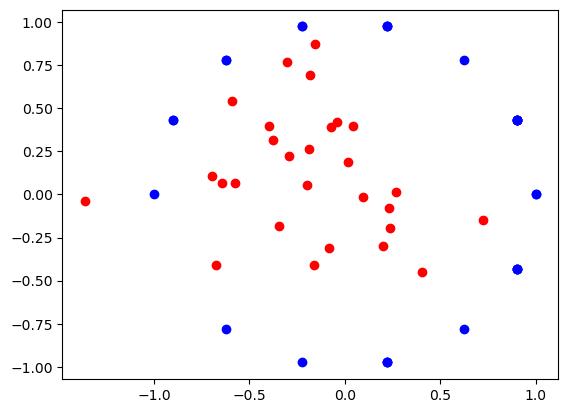

In [258]:
plt.scatter(xbar[:,0],xbar[:,1], color='red')
plt.scatter(x[:,0],x[:,1], color='blue')
plt.scatter(x1[:,0],x1[:,1], color='red')
plt.scatter(x2[:,0],x2[:,1], color='blue')


In [254]:
x1 = np.array([[ 0.0948, -0.0170],
        [ 0.0188,  0.1908],
        [-0.2941,  0.2249],
        [-0.0414,  0.4225],
        [-0.3449, -0.1836],
        [ 0.4053, -0.4498],
        [-0.6725, -0.4116],
        [-0.5751,  0.0645],
        [-0.1615, -0.4074],
        [ 0.2305, -0.0789],
        [-0.0715,  0.3902],
        [-0.3006,  0.7685],
        [ 0.1980, -0.2979],
        [ 0.7217, -0.1510],
        [-0.1868,  0.2640],
        [-0.1963,  0.0576]])
x2 = np.array([[ 2.2252e-01, -9.7493e-01],
        [-9.0097e-01,  4.3388e-01],
        [ 9.0097e-01, -4.3388e-01],
        [-1.0000e+00,  1.2246e-16],
        [-2.2252e-01,  9.7493e-01],
        [ 9.0097e-01, -4.3388e-01],
        [-6.2349e-01,  7.8183e-01],
        [ 2.2252e-01, -9.7493e-01],
        [-6.2349e-01, -7.8183e-01],
        [-9.0097e-01,  4.3388e-01],
        [ 6.2349e-01,  7.8183e-01],
        [ 1.0000e+00,  0.0000e+00],
        [ 9.0097e-01, -4.3388e-01],
        [ 1.0000e+00,  0.0000e+00],
        [ 9.0097e-01,  4.3388e-01],
        [ 9.0097e-01,  4.3388e-01]])

In [380]:
import matplotlib.cm as cm
x = np.array([[ 0.2514, -0.1005],
        [ 0.0867, -0.4983],
        [ 0.1523,  0.3942],
        [ 0.1437, -0.2790],
        [-0.5326, -0.1042],
        [ 0.0919,  0.0217],
        [-0.2254,  0.7571],
        [ 0.2891, -0.0279],
        [ 0.0099, -0.1777],
        [ 0.7720, -0.1825],
        [ 0.3874, -0.3061],
        [-0.1544, -0.4754],
        [ 0.1952,  0.2205],
        [ 0.2292, -0.0529],
        [-0.6150,  0.1175],
        [ 0.2463, -0.1922],
        [-0.3405, -0.3938],
        [-0.2527, -0.6317],
        [-0.1221,  0.2200],
        [-0.4720,  0.0460],
        [ 0.8425,  0.2990],
        [ 0.1670, -0.5926],
        [ 0.8210, -0.0267],
        [ 0.6705,  0.0206],
        [-0.1507, -0.3301],
        [-0.2013, -0.1993],
        [-0.0181, -0.3608],
        [-0.2688, -0.3215],
        [-0.4681, -0.2048],
        [ 0.2989,  0.2419],
        [ 0.6106, -0.2857],
        [-0.8385, -0.0491],
        [-0.2172, -0.3595],
        [ 0.7496, -0.1497],
        [ 0.2810, -0.1346],
        [-0.3236, -0.0581],
        [ 0.4182,  0.7622],
        [-0.1978, -0.2261],
        [ 0.4793, -0.2222],
        [-0.7297,  0.0920],
        [-0.1009, -0.4676],
        [ 0.6912, -0.0356],
        [ 0.4324,  0.1014],
        [-0.0387, -0.7813]
             ])
              
              
y=np.array([[-0.2225, -0.9749],
        [ 0.6235,  0.7818],
        [-0.2225,  0.9749],
        [ 0.6235,  0.7818],
        [-0.9010, -0.4339],
        [-0.2225,  0.9749],
        [ 1.0000,  0.0000],
        [ 0.9010, -0.4339],
        [ 0.2225, -0.9749],
        [ 0.2225, -0.9749],
        [ 1.0000,  0.0000],
        [-0.2225, -0.9749],
        [ 0.6235,  0.7818],
        [ 0.9010, -0.4339],
        [-0.2225, -0.9749],
        [-0.9010, -0.4339],
        [-1.0000e+00,  1.2246e-16],
        [-6.2349e-01, -7.8183e-01],
        [-6.2349e-01,  7.8183e-01],
        [-9.0097e-01, -4.3388e-01],
        [-9.0097e-01, -4.3388e-01],
        [-6.2349e-01, -7.8183e-01],
        [-9.0097e-01,  4.3388e-01],
        [-6.2349e-01,  7.8183e-01],
        [ 2.2252e-01,  9.7493e-01],
        [-9.0097e-01,  4.3388e-01],
        [-6.2349e-01, -7.8183e-01],
        [ 9.0097e-01, -4.3388e-01],
        [ 2.2252e-01, -9.7493e-01],
        [-9.0097e-01, -4.3388e-01],
        [ 1.0000e+00,  0.0000e+00],
        [ 6.2349e-01, -7.8183e-01],
        [-0.2225, -0.9749],
        [-0.6235,  0.7818],
        [ 0.6235,  0.7818],
        [-0.9010, -0.4339],
        [ 0.2225,  0.9749],
        [ 0.9010, -0.4339],
        [-0.9010,  0.4339],
        [ 0.2225,  0.9749],
        [-0.6235, -0.7818],
        [-0.9010,  0.4339],
        [ 1.0000,  0.0000],
        [-0.2225, -0.9749]
           ])
            

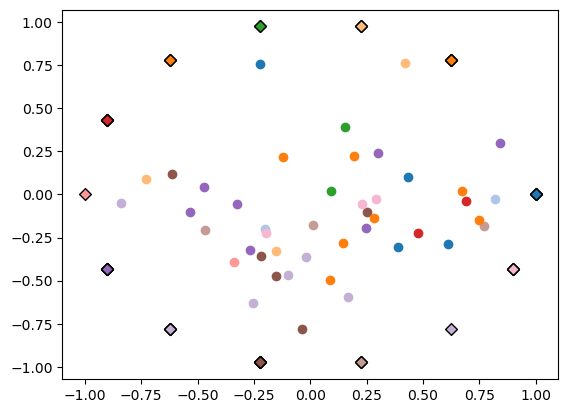

In [401]:
unique_labels = list(range(14))
target_coords =[]
for i in range(14):
    coord = (np.cos(unique_labels[i]/14 * 2 * np.pi),np.sin(unique_labels[i]/14 * 2 * np.pi))
    target_coords.append(coord)
#print(target_coords)

for i in range(len(x)):
    a = y[i]
    
    amin = min(enumerate(target_coords), key=lambda x: abs(x[1][0]-a[0]))
    bmin = min(enumerate(target_coords), key=lambda x: abs(x[1][1]-a[1]))

    if (np.sign(amin[1][0])==np.sign(a[0]) and np.sign(amin[1][1])==np.sign(a[1])):
        index = amin[0]
    else:
        index = bmin[0]
    color = plt.cm.tab20(index)
    plt.scatter(x[i,0],x[i,1], color = color)
    plt.scatter(y[i,0],y[i,1], color=color,edgecolors='black', marker='D')

In [404]:
tests = 'bsodjhfu.npy'
tests[:-4]

'bsodjhfu'

In [379]:
a = (-1.0, 1.2246467991473532e-16)
amin = min(enumerate(target_coords), key=lambda x: abs(x[1][0]-a[0]))
bmin = min(enumerate(target_coords), key=lambda x: abs(x[1][1]-a[1]))

if (np.sign(amin[1][0])==np.sign(a[0]) and np.sign(amin[1][1])==np.sign(a[1])):
    index = amin[0]
else:
    index = bmin[0]


7


In [410]:
classes = ['Apple', 'Banana', 'Ivy']
classes_count=[0 for c in classes]

In [418]:
import numpy as np
from sklearn.model_selection import train_test_split
X, y = np.arange(10).reshape((5, 2)), range(5)
print(X)
print(list(y))

[[0 1]
 [2 3]
 [4 5]
 [6 7]
 [8 9]]
[0, 1, 2, 3, 4]


In [428]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=.5, test_size=.5, random_state=42)

In [429]:
X_test

array([[2, 3],
       [8, 9],
       [4, 5]])

In [430]:
X_train

array([[0, 1],
       [6, 7]])

NameError: name 'CNN' is not defined

In [434]:
model = CNN(num_classes=train_dataset.num_classes)


state_dict = torch.load('outputs/best_model.pth')['model_state_dict']
model.load_state_dict(state_dict)
model.eval()
print('Using validation to compute confusion matrix')
valid_running_pred = []
valid_running_labels = []
counter = 0
with torch.no_grad():
    for i, data in tqdm(enumerate(valid_loader), total=len(valid_loader)):
        counter += 1
        
        image, labels = data
        image = image.to(device)
        labels = labels.to(device)
        # forward pass
        outputs = model(image)
        # calculate the accuracy
        _, preds = torch.max(outputs.data, 1)

        valid_running_pred.append(preds)
        valid_running_labels.append(labels)
    
# confusion matrix for the complete epoch
valid_running_pred = torch.cat(valid_running_pred)
valid_running_labels = torch.cat(valid_running_labels)
print('classes:',valid_dataset.classes)
save_cf(valid_running_pred,valid_running_labels, valid_dataset.classes)

array([1, 4, 2, 0, 3])

In [316]:
N = len(x)
# define the colormap
cmap = plt.cm.jet
# extract all colors from the .viridis map
cmaplist = [cmap(i) for i in range(cmap.N)]
# create the new map
cmap = cmap.from_list('Custom cmap', cmaplist, cmap.N)

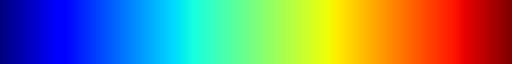

In [317]:
cmap

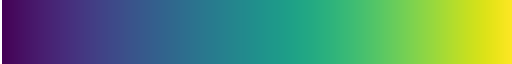

In [318]:
import matplotlib.colors

cmap = plt.cm.viridis
cmaplist = [cmap(i) for i in range(cmap.N)]
cmaplist[0] = (1.0,1.0,1.0,1.0)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list('mcm',cmaplist, cmap.N)
cmap

In [304]:
tmp_output=[]
for i in range(5):
    outputs = torch.tensor([[2,3],[3,5],[5,6], [20,3]])
    tmp_output.append(outputs)
tmp_output = torch.cat(tmp_output)
print(tmp_output.shape)



torch.Size([20, 2])


NameError: name 'output' is not defined

In [519]:
image_type = 'ect'
image_path = '../data/ALLleaves_ECT_rotate/50eachclass/ect32.48/train'
print(image_path)

# Dict to map class names to indices
classes = []
for (dirpath, dirnames, filenames) in os.walk(image_path):
    classes.extend(dirnames)
    break
idx_to_class = {i:j for i, j in enumerate(classes)}
class_to_idx = {value:key for key,value in idx_to_class.items()}
num_classes = len(classes)
print('num_classes=',num_classes)
    
numpy_data=[]
numpy_target=[]
outlines_train=[]
classes_count=[0 for c in classes]
for path, subdirs, files in os.walk(image_path):

    files = [f for f in files if not f[0] == '.']
    subdirs[:] = [d for d in subdirs if not d[0] == '.']

    for name in files:
        input_filedir = os.path.join(path, name)

        if image_type=='image':
            image = np.array(Image.open(input_filedir).convert('L'))#Converting to grayscale, using only 1 channel
        elif image_type=='ect' or 'sect':
            image = np.load(input_filedir)
            
        inputdir = os.path.join(path[:41]+'outline'+path[44:], name[:-4])
        outline = cv2.imread(inputdir+'.png') 
        
            
        splitpath = os.path.normpath(input_filedir).split(os.path.sep)
        label = list(set(splitpath).intersection(classes))[0]

        #if classes_count[class_to_idx[label]]< 50:
        if True:
            numpy_data.append(image)
            numpy_target.append(class_to_idx[label])
            outlines_train.append(outline)
            classes_count[class_to_idx[label]]+=1


numpy_data_train = np.array(numpy_data)
numpy_target_train = np.array(numpy_target)


../data/ALLleaves_ECT_rotate/50eachclass/ect32.48/train
num_classes= 14


In [520]:
image_type = 'ect'
image_path = '../data/ALLleaves_ECT_rotate/50eachclass/ect32.48/test8'
print(image_path)

# Dict to map class names to indices
classes = []
for (dirpath, dirnames, filenames) in os.walk(image_path):
    classes.extend(dirnames)
    break
idx_to_class = {i:j for i, j in enumerate(classes)}
class_to_idx = {value:key for key,value in idx_to_class.items()}
num_classes = len(classes)
print('num_classes=',num_classes)
    
numpy_data=[]
numpy_target=[]
outlines =[]
classes_count=[0 for c in classes]
for path, subdirs, files in os.walk(image_path):

    files = [f for f in files if not f[0] == '.']
    subdirs[:] = [d for d in subdirs if not d[0] == '.']

    for name in files:
        input_filedir = os.path.join(path, name)
        if image_type=='image':
            image = np.array(Image.open(input_filedir).convert('L'))#Converting to grayscale, using only 1 channel
        elif image_type=='ect' or 'sect':
            image = np.load(input_filedir)
        inputdir = os.path.join(path[:41]+'outline'+path[44:], name[:-4])
        outline = cv2.imread(inputdir+'.png') 
        
        splitpath = os.path.normpath(input_filedir).split(os.path.sep)
        label = list(set(splitpath).intersection(classes))[0]

        #if classes_count[class_to_idx[label]]< 50:
        if True:
            numpy_data.append(image)
            numpy_target.append(class_to_idx[label])
            outlines.append(outline)
            classes_count[class_to_idx[label]]+=1


numpy_data = np.array(numpy_data)
numpy_target = np.array(numpy_target)


../data/ALLleaves_ECT_rotate/50eachclass/ect32.48/test8
num_classes= 14


In [521]:
print(len(numpy_data_train))
print(len(numpy_data))
print(numpy_target)
print(len(outlines))

700
700
[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6 

(-0.5, 31.5, 47.5, -0.5)

<Figure size 1000x500 with 0 Axes>

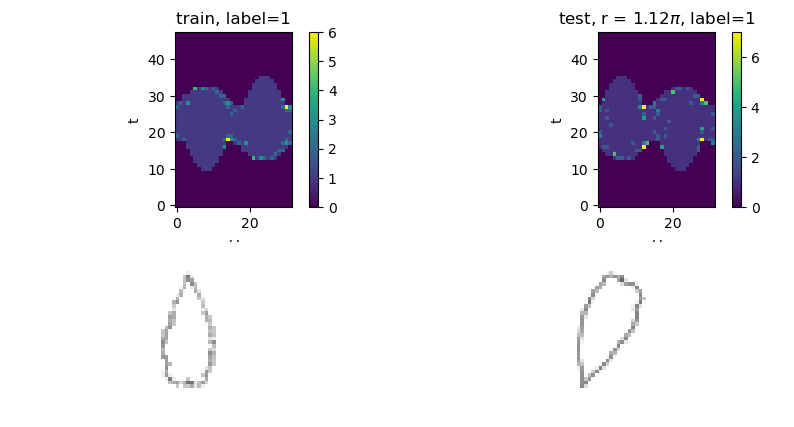

In [535]:
idx = 51
angles = [1.165437796416464, 3.906434868614607, 5.468126549189142, 5.144402255741231, 5.754563650541671, 4.760881857822241, 2.486110454278915, 2.204038763613354, 3.50796449906843, 4.8978570600402]
fig = plt.figure(figsize=(10,5))
fig, axes = plt.subplots(2, 2, figsize=(10,5))

im1 = axes[0,0].imshow(numpy_data_train[idx], origin='lower')
axes[0,0].set_title('train, label='+str (numpy_target_train[idx] ))
axes[0,0].set_xlabel('$\omega$')
axes[0,0].set_ylabel('t')
plt.colorbar(im1, ax=axes[0,0])

axes[1,0].imshow(outlines_train[idx])
axes[1,0].axis('off')
axes[1,0].axis('equal')

im2 = axes[0,1].imshow(numpy_data[idx], origin='lower')
axes[0,1].set_title('test, r = '+str(round(angles[8]/np.pi, 2))+'$\pi$, label='+str(numpy_target[idx] ))
axes[0,1].set_xlabel('$\omega$')
axes[0,1].set_ylabel('t')

plt.colorbar(im2, ax=axes[0,1])
axes[1,1].imshow(outlines[idx])
axes[1,1].axis('off')
axes[1,1].axis('equal')



[ WARN:0@237395.095] global loadsave.cpp:248 findDecoder imread_('../data/ALLleaves_ECT_rotate/50eachclass/outline32.48/test8/.png'): can't open/read file: check file path/integrity


TypeError: Image data of dtype object cannot be converted to float

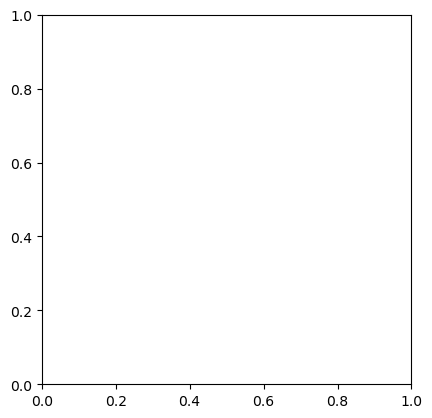

In [145]:
import cv2
inputdir ='../data/ALLleaves_ECT_rotate/50eachclass/outline32.48/test8/'
outline = cv2.imread(inputdir+'.png') 
plt.imshow(outline)
plt.axis('off')
plt.axis('equal')

In [20]:
sample = torch.rand([1,48,32])
import random

In [35]:
input_filedir = '../data/ALLleaves_ECT_rotate/50eachclass/ect32.48/train/Passiflora/Pame6_2.npy'
ect = np.load(input_filedir)

(-0.5, 31.5, 47.5, -0.5)

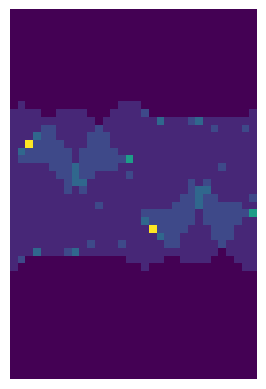

In [38]:
plt.imshow(ect)
plt.axis('off')


In [3]:
r_angle = random.uniform(0, 2*np.pi)
cols = np.linspace(0,2*np.pi, 32)
col_idx = min(range(len(cols)), key=lambda i: abs(cols[i]-r_angle))
#Translate columns of image according to the random angle
first = ect[:,col_idx:]
second = ect[:,0:col_idx]
new_image = np.concatenate((first,second), axis=1)
plt.imshow(new_image)
plt.axis('off')

NameError: name 'random' is not defined

# rotation of image/ translation of ect transform

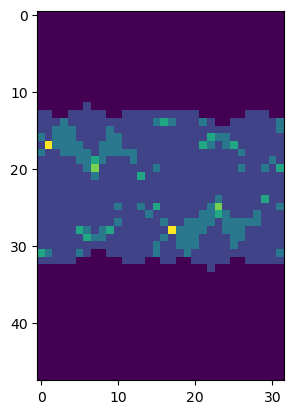

In [6]:
input_filedir = '../data/ALLleaves_ECT_cotton_rotation/rotation0'
outline = cv2.imread(input_filedir+'.png') 
ect = np.load(input_filedir+'.npy')
plt.imshow(ect)

In [20]:
import random
mat = torch.tensor(ect).unsqueeze(0)
mat.shape

torch.Size([1, 48, 32])

In [27]:
def translate(mat):
    # get random rotation angle, use to determine how many columns to shift
    r_angle = random.uniform(0, 2*np.pi)
    cols = np.linspace(0,2*np.pi, 32)
    col_idx = min(range(len(cols)), key=lambda i: abs(cols[i]-r_angle))
    #Translate columns of image according to the random angle
    first = mat[:,:,col_idx:]
    second = mat[:,:,0:col_idx]
    new_image = torch.concatenate((first,second), axis=2)

    return new_image

In [28]:
mat_new = translate(mat)

In [29]:
mat_new.type

<function Tensor.type>

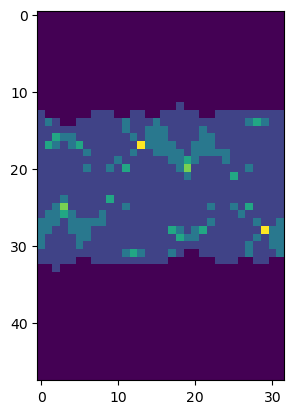

In [30]:
plt.imshow(mat_new[0,:,:])

# Testing translation invariance
https://blog.paperspace.com/pooling-and-translation-invariance-in-convolutional-neural-networks/

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.notebook import tqdm
import seaborn as sns
from torchvision.utils import make_grid

In [2]:
def convolve(image_path, filter, title=''):
    """This function performs convolution over an image
    with the aim of edge detection"""

    if type(image_path) == np.ndarray:
        image = image_path
    else: 
      #  reading image
      image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    #  defining filter size
    filter_size = filter.shape[0]

    #  creating an array to store convolutions
    convolved = np.zeros(((image.shape[0] - filter_size) + 1, 
                      (image.shape[1] - filter_size) + 1))
    
    #  performing convolution
    for i in tqdm(range(image.shape[0])):
        for j in range(image.shape[1]):
            try:
                convolved[i,j] = (image[i:(i+filter_size),
                                  j:(j+filter_size)] * filter).sum()
            except Exception:
                pass

    #  converting to tensor
    convolved = torch.tensor(convolved)
    #  applying relu activation
    convolved = F.relu(convolved)

    #  producing plots
    figure, axes = plt.subplots(1,2, dpi=120)
    plt.suptitle(title)
    axes[0].imshow(image, cmap='gray')
    axes[0].axis('off')
    axes[0].set_title('original')
    axes[1].imshow(convolved,)
    axes[1].axis('off')
    axes[1].set_title('convolved')
    return convolved

  0%|          | 0/389 [00:00<?, ?it/s]

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], dtype=torch.float64)

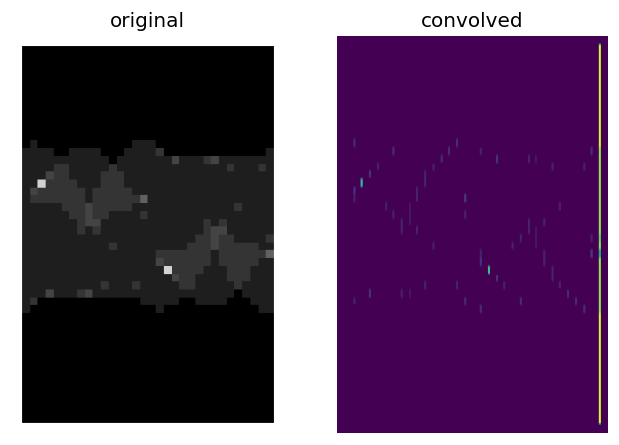

In [5]:
#  defining sobel filter
sobel_y = np.array(([-1,0,1],
                    [-1,0,1],
                    [-1,0,1]))

#  detecting edges in image
convolve('download1.png', filter=sobel_y)

  0%|          | 0/389 [00:00<?, ?it/s]

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], dtype=torch.float64)

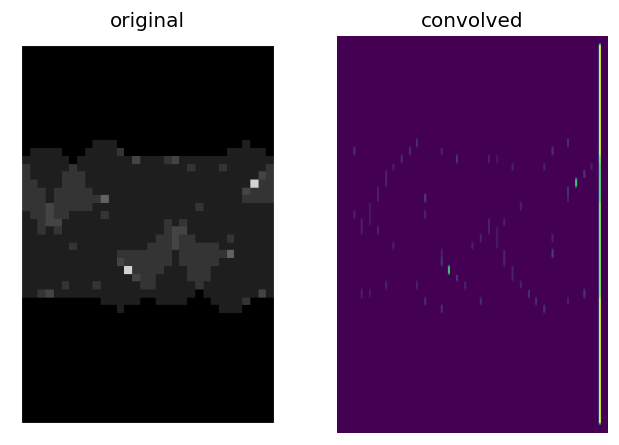

In [6]:
#  detecting edge in mirrored version of image
convolve('download2.png', filter=sobel_y)

In [9]:
def max_pool(image, kernel_size=2, visualize=False, title=''):

    #  assessing image parameter
    if type(image) is np.ndarray and len(image.shape)==2:
        image = image
    else:
        image = cv2.imread(image, cv2.IMREAD_GRAYSCALE)

    #  creating an empty list to store pooling
    pooled = np.zeros((image.shape[0]//kernel_size, 
                        image.shape[1]//kernel_size))
      
    #  instantiating counter
    k=-1
    #  maxpooling
    for i in tqdm(range(0, image.shape[0], kernel_size)):
        k+=1
        l=-1
        if k==pooled.shape[0]:
            break
        for j in range(0, image.shape[1], kernel_size):
            l+=1
            if l==pooled.shape[1]:
                break
            try:
                pooled[k,l] = (image[i:(i+kernel_size), 
                                j:(j+kernel_size)]).max()
            except ValueError:
                pass
            
    if visualize:
        #  displaying results
        figure, axes = plt.subplots(1,2, dpi=120)
        plt.suptitle(title)
        axes[0].imshow(image, cmap='gray')
        axes[0].set_title('reference image')
        axes[1].imshow(pooled, cmap='gray')
        axes[1].set_title('averagepooled')
    return pooled

In [10]:
def visualize_pooling(image, iterations, kernel=2, dpi=700):

    
    #  creating empty list to hold pools
    pools = []
    pools.append(image)

    #  performing pooling
    for iteration in range(iterations):
        pool = max_pool(pools[-1], kernel)
        pools.append(pool)

    #  visualisation
    fig, axis = plt.subplots(1, len(pools), dpi=dpi)
    for i in range(len(pools)):
        axis[i].imshow(pools[i])
        axis[i].set_title(f'{pools[i].shape}', fontsize=5)
        axis[i].axis('off')
    pass

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

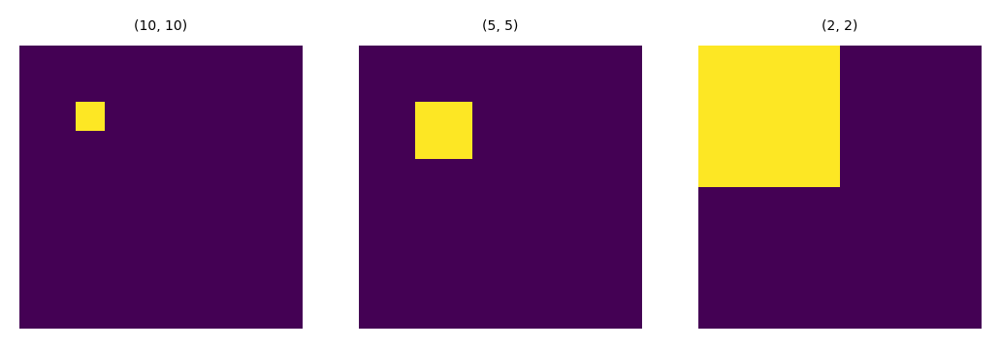

In [14]:
#  recreating image
image_1 = np.zeros((10, 10))
image_1[2, 2] = 1.0
visualize_pooling(image_1, 2, dpi=200)

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

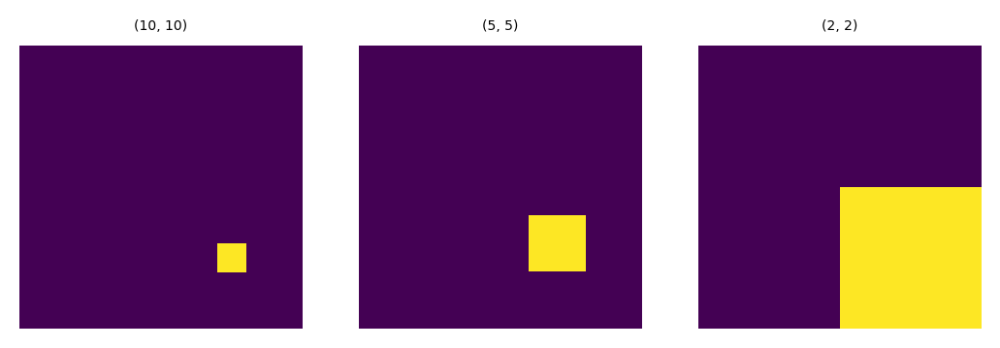

In [15]:
image_2 = np.zeros((10, 10))
image_2[-3, -3] = 1.0
visualize_pooling(image_2, 2, dpi=200)

  0%|          | 0/389 [00:00<?, ?it/s]

  0%|          | 0/194 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

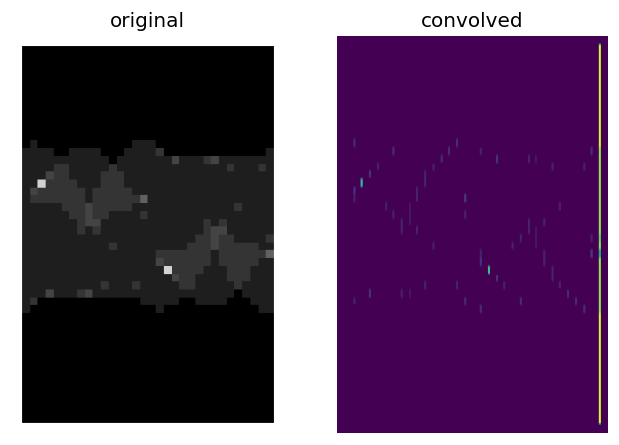

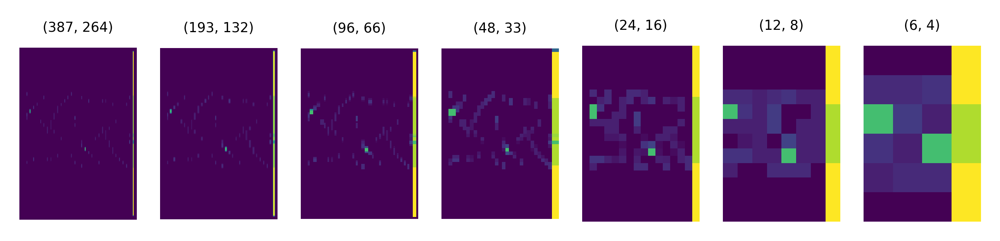

In [17]:
#  detecting edges in image
edges = convolve('download1.png', filter=sobel_y)

#  going through 6 iterations of max pooling
visualize_pooling(np.array(edges), 6, dpi=500)

  0%|          | 0/389 [00:00<?, ?it/s]

  0%|          | 0/194 [00:00<?, ?it/s]

  0%|          | 0/97 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

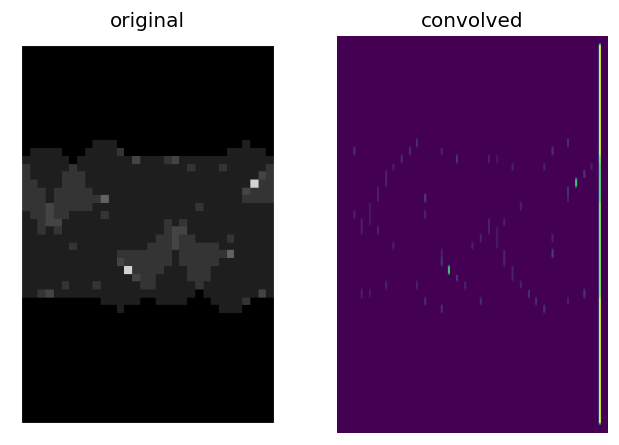

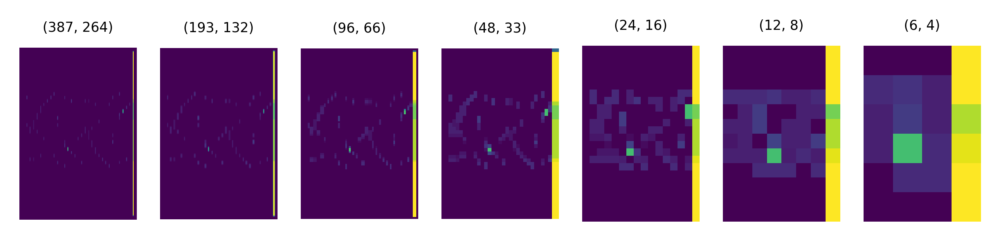

In [18]:
#  detecting edges in image
edges_2 = convolve('download2.png', filter=sobel_y)

#  going through 6 iterations of max pooling
visualize_pooling(np.array(edges_2), 6, dpi=500)

# normalizing ect images

0.0 9.0


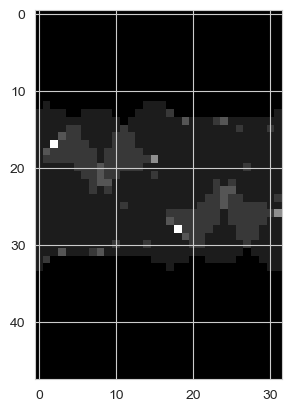

In [81]:
input_filedir = '../data/ALLleaves_ECT_rotate/50eachclass/ect32.48/train/Passiflora/Pame6_2.npy'
ectA = np.load(input_filedir)
print(ectA.min(), ectA.max())
plt.imshow(ectA, cmap='gray')

-9.0 1.0


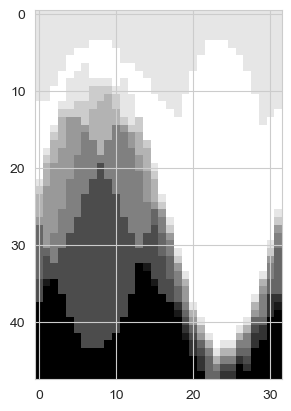

In [73]:
input_filedir = '../data/leafgraph_ECT/32dirs_48thresh_NPY/actinia/leaf_0.npy'
ectB = np.load(input_filedir)
print(ectB.min(), ectB.max())
plt.imshow(ectB, cmap='gray')

1.0 14.0


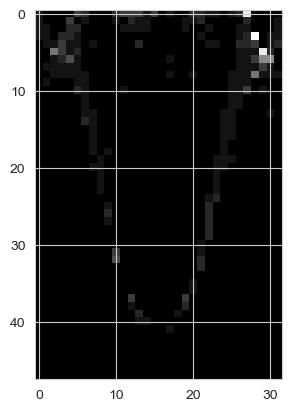

In [74]:
input_filedir = '../data/MPEG7_ECT/32dirs_48thresh_NPY/apple/apple-1.npy'
ectC = np.load(input_filedir)
print(ectC.min(), ectC.max())
plt.imshow(ectC, cmap='gray')

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], dtype=torch.float64)


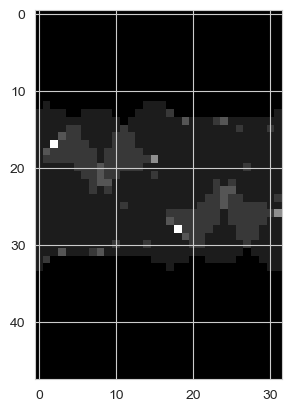

In [83]:
tectA=torch.tensor(ectA)
print(tectA)
plt.imshow(tectA, cmap='gray')

In [88]:
new = transforms.Normalize(tectA,0.5,0.5)

In [90]:
def rescale(arr):
    new_arr = ((arr - arr.min()) * (1/(arr.max() - arr.min()) * 255)).astype('uint8')
    return new_arr

In [96]:
ectB_r = rescale(ectB)

0 255


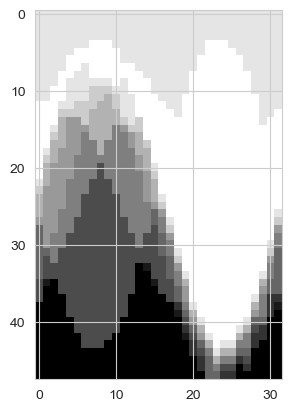

In [97]:
print(ectB_r.min(), ectB_r.max())
plt.imshow(ectB_r, cmap='gray')

In [98]:
arg='sect'
arg == ('ect' or 'sect' or 'image')

False

# Resizing PNG images

In [103]:
from PIL import Image

img = Image.open('../data/MPEG7original/apple-1.gif')

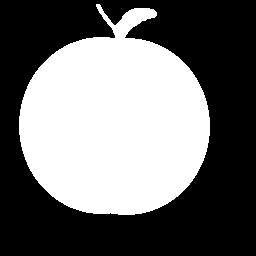

In [112]:
img

In [113]:
print(img.size)

(256, 256)


In [114]:
newsize = (32, 48)
img = img.resize(newsize)
#img.save('myResizedImage.png')

In [123]:
mypath = '../data/MPEG7original_subset/'
mypath_output = '../data/MPEG7_images_small/'


done_species = []
# loop through file system
classes=[]
for path, subdirs, files in os.walk(mypath):
    classes.extend(subdirs)
    files = [f for f in files if not f[0] == '.']
    subdirs[:] = [d for d in subdirs if (d[0] != '.' and d not in done_species)]
    print('Computing image version of outlines in ', path, '...')
    print(len(files))
    for name in files:
        input_filedir = os.path.join(path, name)
        output_filedir = os.path.join(mypath_output+ input_filedir[len(mypath):-3])
        img = Image.open(input_filedir)
        #resize
        newsize = (32, 48)
        img = img.resize(newsize)

        # PNG file to save
        Path(os.path.dirname(output_filedir)).mkdir(parents=True, exist_ok=True)
        img.save(output_filedir+'.png')

    print('----------------\n completed subdirectory ', path ,'\n-------------', )

Computing image version of outlines in  ../data/MPEG7original_subset/ ...
0
----------------
 completed subdirectory  ../data/MPEG7original_subset/ 
-------------
Computing image version of outlines in  ../data/MPEG7original_subset/fork ...
20
----------------
 completed subdirectory  ../data/MPEG7original_subset/fork 
-------------
Computing image version of outlines in  ../data/MPEG7original_subset/fountain ...
20
----------------
 completed subdirectory  ../data/MPEG7original_subset/fountain 
-------------
Computing image version of outlines in  ../data/MPEG7original_subset/hammer ...
20
----------------
 completed subdirectory  ../data/MPEG7original_subset/hammer 
-------------
Computing image version of outlines in  ../data/MPEG7original_subset/Heart ...
20
----------------
 completed subdirectory  ../data/MPEG7original_subset/Heart 
-------------
Computing image version of outlines in  ../data/MPEG7original_subset/Glas ...
20
----------------
 completed subdirectory  ../data/MPEG

# Bounding box of leaf graph dataset

In [124]:
def bounding_box(points):
    """
    Function to find a bounding box of a set of points.
    """
    x_coord, y_coord = zip(*points)
    return [(min(x_coord), min(y_coord)), (max(x_coord), max(y_coord))]


49785

In [138]:
## COLLECT ALL POINTS
filename = "../data/0.procrustes_landmarks.txt"
df = pd.read_csv(filename, sep='	').transpose()
labels = df[:][:5].transpose()
global_pos_list =[]
for p in range(len(df.columns)):
    valuesX = df[p].iloc[5::2]
    valuesY = df[p].iloc[6::2]
    for j in range(15):
        global_pos_list.append((valuesX.T[j], valuesY.T[j]))

            
print('Loaded all data points, computing global bounding box...')
x_box,y_box = zip(*bounding_box(global_pos_list)) # build a bounding box
# bounding box size (use to get a radius for the bounding circle)
print('Completed bounding box, starting ect computations...')
dist = math.dist((x_box[0],y_box[0]),(x_box[1],y_box[1]))
r = dist/2

Loaded all data points, computing global bounding box...
Completed bounding box, starting ect computations...


-9.0 1.0


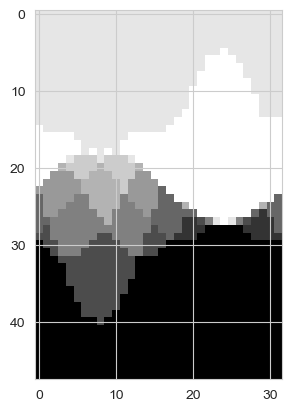

In [143]:
input_filedir = '../data/leafgraph_ECT2/actinia/leaf_3.npy'
ectB = np.load(input_filedir)
print(ectB.min(), ectB.max())
plt.imshow(ectB, cmap='gray')

In [145]:
options = {
    "node_size": 0,
    "node_color": "black",
    "edgecolors": "black",
    "linewidths": 1,
    "width": 2,
    'with_labels':False,
}
G = nx.Graph()
G.add_edge(0, 5)
G.add_edge(0, 6)
G.add_edge(0, 1)
G.add_edge(1, 6)
G.add_edge(1, 8)
G.add_edge(1, 2)
G.add_edge(2, 8)
G.add_edge(2, 10)
G.add_edge(2, 3)
G.add_edge(3, 10)
G.add_edge(3, 12)
G.add_edge(3, 4)
G.add_edge(4, 12)
G.add_edge(4, 14)
G.add_edge(4, 5)
G.add_edge(5, 14)
G.add_edge(6, 7)
G.add_edge(7, 8)
G.add_edge(8, 9)
G.add_edge(9, 10)
G.add_edge(10, 11)
G.add_edge(11, 12)
G.add_edge(12, 13)
G.add_edge(13, 14)

(-1.1970166786537073,
 1.0733659991652074,
 -1.0940094597300207,
 1.1443843644849072)

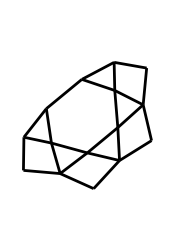

In [147]:
#Plot the leaf
plt.figure(figsize=(2,3))
nx.draw_networkx(G, **options)
plt.axis('off')
plt.axis('equal')

In [144]:
dataset = []
for p in range(len(df.columns)):
    
    # Get the vertex positions
    pos = {}
    valuesX = df[p].iloc[5::2]
    valuesY = df[p].iloc[6::2]
    for i in range(15):
        pos[i] = (valuesX[i],valuesY[i])
    
    

NameError: name 'G' is not defined

In [ ]:
#Plot the leaf
plt.figure(figsize=(2,3))
nx.draw_networkx(G, pos, **options)
plt.axis('off')
plt.axis('equal')


# PNG file to save
Path(os.path.dirname(output_filedir)).mkdir(parents=True, exist_ok=True)
plt.savefig(output_filedir, dpi=16)
plt.close()

# Figure generation to show transforms on each dataset

In [16]:
def rescale(arr):
    new_arr = ((arr - arr.min()) * (1/(arr.max() - arr.min()) * 255)).astype('uint8')
    return new_arr

In [17]:
class SECT(object):
    """Transform the ECT matrix to the smooth euler characteristic transform for the image in a sample.
    """

    def __call__(self, sample):
        # compute average of each direction omega (i.e. column)
        col_means = torch.mean(sample, dim=1)

        # subtract it so that the mean of each column is zero
        sample = sample-col_means
        # Take integral from bottom to top of matrix (from first to last threshold)
        SECT = torch.cumsum(sample, dim=1)
        
        #rescale the tensor image back to [0,1]
        SECT_scale = ((SECT - SECT.min()) * (1/(SECT.max() - SECT.min())))
        
        return SECT_scale

In [18]:
# load image
leafoutline_dirs = ['Cotton/2a_861a', 'Ivy/Vine1_12', 'Tomato/Tomato/field/F2/F_k2_t2','Grape/Geneva_2016/MF_Geneva_2016/483169_b_10', 'Apple/1001_28']
leafgraph_dirs = ['amethystina/leaf_193','ligularis/leaf_1439', 'capsularis/leaf_397','mollissima/leaf_2120','triloba/leaf_3047']
mpeg7_dirs = ['fountain/fountain-03', 'hammer/hammer-5','Glas/Glas-18','Heart/Heart-6','fork/fork-1']


In [19]:
plt.style.use('default')
from matplotlib import colors
%matplotlib inline

In [20]:
#transform images
regtransform = transforms.Compose([transforms.ToTensor(),transforms.Normalize(0.5,0.5)])
SECTtransform = transforms.Compose([transforms.ToTensor(), SECT(), transforms.Normalize(0.5,0.5)])


In [21]:
filedir_ect = '../data/leafgraph_ECT/'+ leafgraph_dirs[0]+'.npy'
    
ect = rescale(np.load(filedir_ect))
#ect=np.load(filedir_ect)

0 255


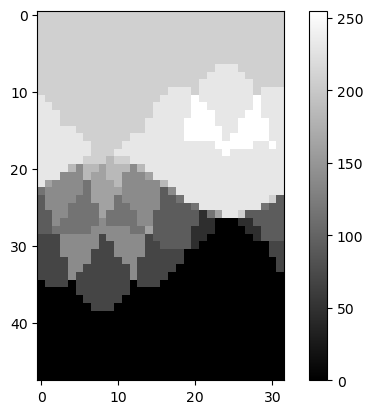

In [22]:
plt.imshow(ect, cmap='gray')
print(ect.min(), ect.max())
plt.colorbar()

In [79]:
test = SECTtransform(ect)

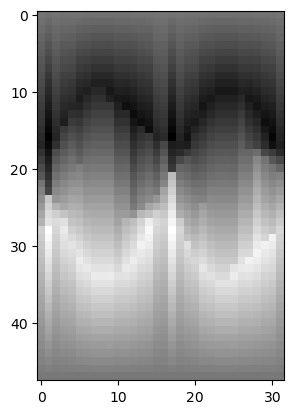

In [82]:
plt.imshow(test[0,:,:],cmap='gray')

In [73]:
new_arr.min()

tensor(0.)

In [23]:
def add_headers(
    fig,
    *,
    row_headers=None,
    col_headers=None,
    row_pad=1,
    col_pad=8,
    rotate_row_headers=True,
    **text_kwargs
):
    # Based on https://stackoverflow.com/a/25814386

    axes = fig.get_axes()

    for ax in axes:
        print(ax)
        sbs = ax.get_subplotspec()

        # Putting headers on cols
        if (col_headers is not None) and sbs.is_first_row():
            ax.annotate(
                col_headers[sbs.colspan.start],
                xy=(0.5, 1),
                xytext=(0, col_pad),
                xycoords="axes fraction",
                textcoords="offset points",
                ha="center",
                va="baseline",
                **text_kwargs,
            )

        # Putting headers on rows
        if (row_headers is not None) and sbs.is_first_col():
            ax.annotate(
                row_headers[sbs.rowspan.start],
                xy=(0, 0.5),
                xytext=(-ax.yaxis.labelpad - row_pad, 0),
                xycoords=ax.yaxis.label,
                textcoords="offset points",
                ha="right",
                va="center",
                rotation=rotate_row_headers * 90,
                **text_kwargs,
            )
            

AxesSubplot(0.125,0.653529;0.133621x0.226471)
AxesSubplot(0.125,0.381765;0.133621x0.226471)
AxesSubplot(0.125,0.11;0.133621x0.226471)
AxesSubplot(0.285345,0.653529;0.133621x0.226471)
AxesSubplot(0.285345,0.381765;0.133621x0.226471)
AxesSubplot(0.285345,0.11;0.133621x0.226471)
AxesSubplot(0.44569,0.653529;0.133621x0.226471)
AxesSubplot(0.44569,0.381765;0.133621x0.226471)
AxesSubplot(0.44569,0.11;0.133621x0.226471)
AxesSubplot(0.606034,0.653529;0.133621x0.226471)
AxesSubplot(0.606034,0.381765;0.133621x0.226471)
AxesSubplot(0.606034,0.11;0.133621x0.226471)
AxesSubplot(0.766379,0.653529;0.133621x0.226471)
AxesSubplot(0.766379,0.381765;0.133621x0.226471)
AxesSubplot(0.766379,0.11;0.133621x0.226471)
-1.0 1.0


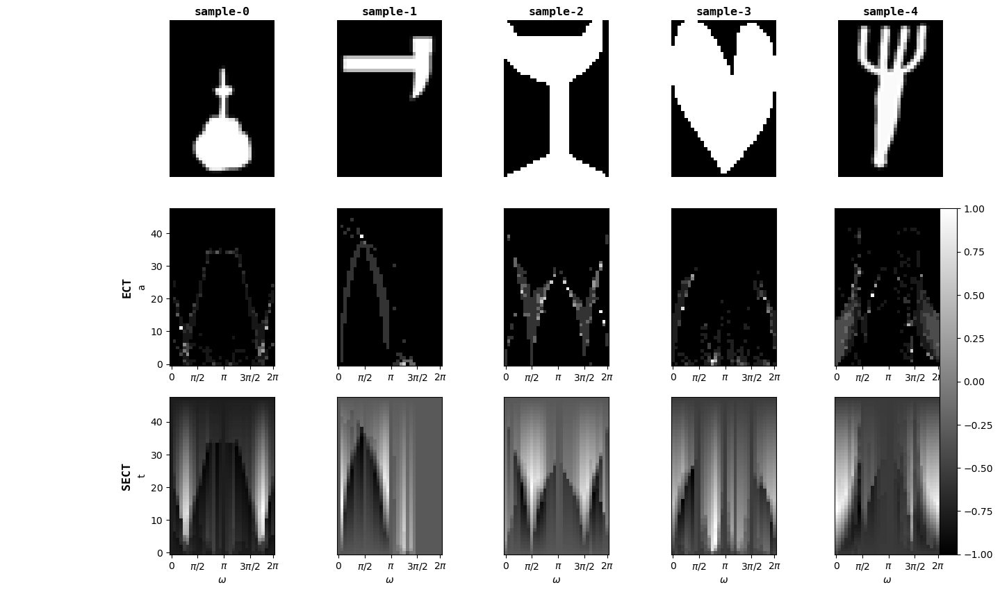

In [215]:
fig = plt.figure(figsize=(15,10))
gs = matplotlib.gridspec.GridSpec(3,5)
plt.style.use('default')

images = []
for i in range(5):
    #filedir_original = '../data/ALLleaves_images/'+ leafoutline_dirs[i] +'.png'
    #filedir_ect = '../data/ALLleaves_ECT/'+ leafoutline_dirs[i]+'.npy'
    #filedir_original = '../data/leafgraph_images_small/'+ leafgraph_dirs[i] +'.png'
    #filedir_ect = '../data/leafgraph_ECT/'+ leafgraph_dirs[i]+'.npy'
    filedir_original = '../data/mpeg7shap_images_small/'+ mpeg7_dirs[i] +'.png'
    filedir_ect = '../data/mpeg7shap_ECT/'+ mpeg7_dirs[i]+'.npy'
    
    image = rescale(np.array(Image.open(filedir_original).convert('L')))
    ect = rescale(np.load(filedir_ect))
    
    ax1= fig.add_subplot(gs[0,i])

    im = ax1.imshow(image, cmap='gray')
    #ax1.set_aspect('equal')
    ax1.set_axis_off()

    
    ax2 = fig.add_subplot(gs[1,i])
    #im2 = ax2.imshow(regtransform(ect)[0,:,:], origin='lower', cmap = 'gray')

    
    ax2.set_xticks([0, 8, 16, 24, 31]) 
    ax2.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
    if i==0:
        ax2.set_ylabel('a')
    else:
        ax2.set_yticks([])
    images.append(ax2.imshow(regtransform(ect)[0,:,:], origin='lower', cmap = 'gray'))

    
    ax3 = fig.add_subplot(gs[2,i])
    #im3 = ax3.imshow(SECTtransform(ect)[0,:,:], origin='lower', cmap = 'gray')

    ax3.set_xlabel('$\omega$')
    ax3.set_xticks([0, 8, 16, 24, 31]) 
    ax3.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
    if i==0:
        ax3.set_ylabel('t')
    else:
        ax3.set_yticks([])

    images.append(ax3.imshow(SECTtransform(ect)[0,:,:], origin='lower', cmap = 'gray'))
    
row_headers = ["Outline", "ECT", "SECT"]
col_headers = ["sample-0", "sample-1", "sample-2","sample-3", "sample-4"]    
font_kwargs = dict(fontfamily="monospace", fontweight="bold", fontsize="large")
add_headers(fig, col_headers=col_headers, row_headers=row_headers, **font_kwargs)

# Find the min and max of all colors for use in setting the color scale.
vmin = min(image.get_array().min() for image in images)
vmax = max(image.get_array().max() for image in images)
print(vmin,vmax)
norm = colors.Normalize(vmin=vmin, vmax=vmax)
for im in images:
    im.set_norm(norm)
fig.colorbar(images[0], ax=[ax2,ax3], orientation='vertical', pad = 0.0)

plt.savefig('outputs/samples_mpeg7.png', dpi=1000, bbox_inches='tight')

## Version to show 7 examples of MPEG7

In [24]:
mpeg7_dirs = ['bone/bone-1','fork/fork-1','fountain/fountain-01','Glas/Glas-1','hammer/hammer-1','Heart/Heart-1','key/key-1']


In [61]:
r = 1
ticks = np.linspace(0,47,7)
tick_labels = np.linspace(-r,r,7)
print(ticks)
print(tick_labels)

[ 0.          7.83333333 15.66666667 23.5        31.33333333 39.16666667
 47.        ]
[-1.         -0.66666667 -0.33333333  0.          0.33333333  0.66666667
  1.        ]


AxesSubplot(0.125,0.653529;0.0945122x0.226471)
AxesSubplot(0.125,0.381765;0.0945122x0.226471)
AxesSubplot(0.125,0.11;0.0945122x0.226471)
AxesSubplot(0.238415,0.653529;0.0945122x0.226471)
AxesSubplot(0.238415,0.381765;0.0945122x0.226471)
AxesSubplot(0.238415,0.11;0.0945122x0.226471)
AxesSubplot(0.351829,0.653529;0.0945122x0.226471)
AxesSubplot(0.351829,0.381765;0.0945122x0.226471)
AxesSubplot(0.351829,0.11;0.0945122x0.226471)
AxesSubplot(0.465244,0.653529;0.0945122x0.226471)
AxesSubplot(0.465244,0.381765;0.0945122x0.226471)
AxesSubplot(0.465244,0.11;0.0945122x0.226471)
AxesSubplot(0.578659,0.653529;0.0945122x0.226471)
AxesSubplot(0.578659,0.381765;0.0945122x0.226471)
AxesSubplot(0.578659,0.11;0.0945122x0.226471)
AxesSubplot(0.692073,0.653529;0.0945122x0.226471)
AxesSubplot(0.692073,0.381765;0.0945122x0.226471)
AxesSubplot(0.692073,0.11;0.0945122x0.226471)
AxesSubplot(0.805488,0.653529;0.0945122x0.226471)
AxesSubplot(0.805488,0.381765;0.0945122x0.226471)
AxesSubplot(0.805488,0.11;0.09451

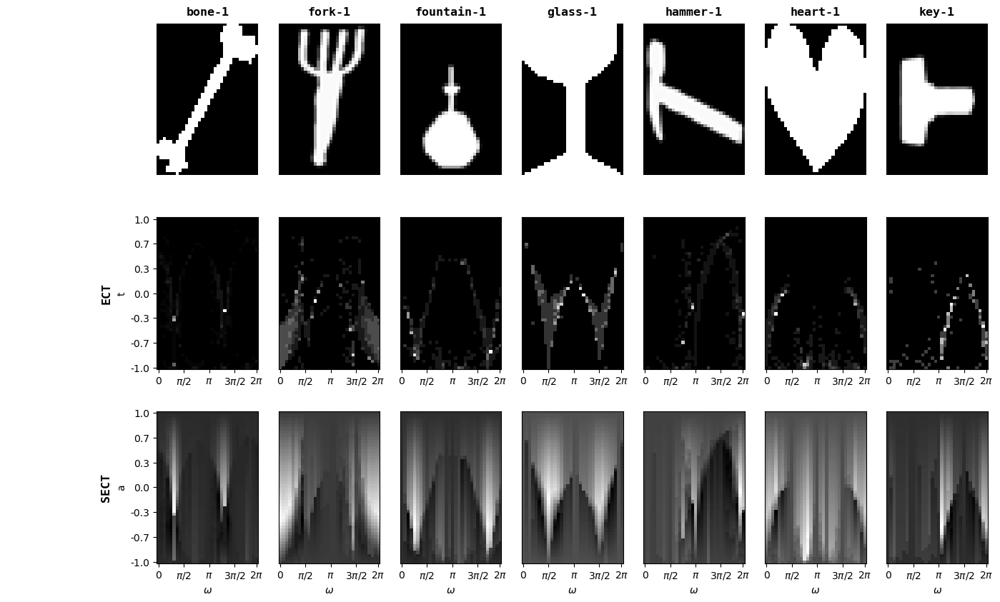

In [62]:
fig = plt.figure(figsize=(15,10))
gs = matplotlib.gridspec.GridSpec(3,7)
plt.style.use('default')

images = []
for i in range(7):
    filedir_original = '../data/mpeg7shap_images_small/'+ mpeg7_dirs[i] +'.png'
    filedir_ect = '../data/mpeg7shap_ECT/'+ mpeg7_dirs[i]+'.npy'
    
    image = rescale(np.array(Image.open(filedir_original).convert('L')))
    ect = rescale(np.load(filedir_ect))
    
    ax1= fig.add_subplot(gs[0,i])

    im = ax1.imshow(image, cmap='gray')
    #ax1.set_aspect('equal')
    ax1.set_axis_off()

    
    ax2 = fig.add_subplot(gs[1,i])
    #im2 = ax2.imshow(regtransform(ect)[0,:,:], origin='lower', cmap = 'gray')

    
    ax2.set_xticks([0, 8, 16, 24, 31]) 
    ax2.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
    if i==0:
        ax2.set_ylabel('t')
        ax2.set_yticks(ticks)
        ax2.set_yticklabels([f'{x:1.1f}' for x in tick_labels])
    else:
        ax2.set_yticks([])
    images.append(ax2.imshow(regtransform(ect)[0,:,:], origin='lower', cmap = 'gray'))

    
    ax3 = fig.add_subplot(gs[2,i])
    #im3 = ax3.imshow(SECTtransform(ect)[0,:,:], origin='lower', cmap = 'gray')

    ax3.set_xlabel('$\omega$')
    ax3.set_xticks([0, 8, 16, 24, 31]) 
    ax3.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
    if i==0:
        ax3.set_ylabel('a')
        ax3.set_yticks(ticks)
        ax3.set_yticklabels([f'{x:1.1f}' for x in tick_labels])
    else:
        ax3.set_yticks([])

    images.append(ax3.imshow(SECTtransform(ect)[0,:,:], origin='lower', cmap = 'gray'))
    
row_headers = ["Outline", "ECT", "SECT"]
col_headers = ["bone-1", "fork-1", "fountain-1","glass-1", "hammer-1","heart-1", "key-1"]    
font_kwargs = dict(fontfamily="monospace", fontweight="bold", fontsize="large")
add_headers(fig, col_headers=col_headers, row_headers=row_headers, **font_kwargs)

# Find the min and max of all colors for use in setting the color scale.
vmin = min(image.get_array().min() for image in images)
vmax = max(image.get_array().max() for image in images)
print(vmin,vmax)
norm = colors.Normalize(vmin=vmin, vmax=vmax)
for im in images:
    im.set_norm(norm)
#fig.colorbar(images[0], ax=[ax2,ax3], orientation='vertical', pad = 0.0)





plt.savefig('outputs/samples_mpeg7.png', dpi=1000, bbox_inches='tight')

## LEAF GRAPH VERSION

In [ ]:
leafgraph_dirs = ['amethystina/leaf_193','ligularis/leaf_1439', 'capsularis/leaf_397','mollissima/leaf_2120','triloba/leaf_3047']

In [64]:
r = 1.24
ticks = np.linspace(0,47,7)
tick_labels = np.linspace(-1.24,1.24,7)
print(ticks)
print(tick_labels)


[ 0.          7.83333333 15.66666667 23.5        31.33333333 39.16666667
 47.        ]
[-1.24       -0.82666667 -0.41333333  0.          0.41333333  0.82666667
  1.24      ]


AxesSubplot(0.125,0.653529;0.133621x0.226471)
AxesSubplot(0.125,0.381765;0.133621x0.226471)
AxesSubplot(0.125,0.11;0.133621x0.226471)
AxesSubplot(0.285345,0.653529;0.133621x0.226471)
AxesSubplot(0.285345,0.381765;0.133621x0.226471)
AxesSubplot(0.285345,0.11;0.133621x0.226471)
AxesSubplot(0.44569,0.653529;0.133621x0.226471)
AxesSubplot(0.44569,0.381765;0.133621x0.226471)
AxesSubplot(0.44569,0.11;0.133621x0.226471)
AxesSubplot(0.606034,0.653529;0.133621x0.226471)
AxesSubplot(0.606034,0.381765;0.133621x0.226471)
AxesSubplot(0.606034,0.11;0.133621x0.226471)
AxesSubplot(0.766379,0.653529;0.133621x0.226471)
AxesSubplot(0.766379,0.381765;0.133621x0.226471)
AxesSubplot(0.766379,0.11;0.133621x0.226471)
-1.0 1.0


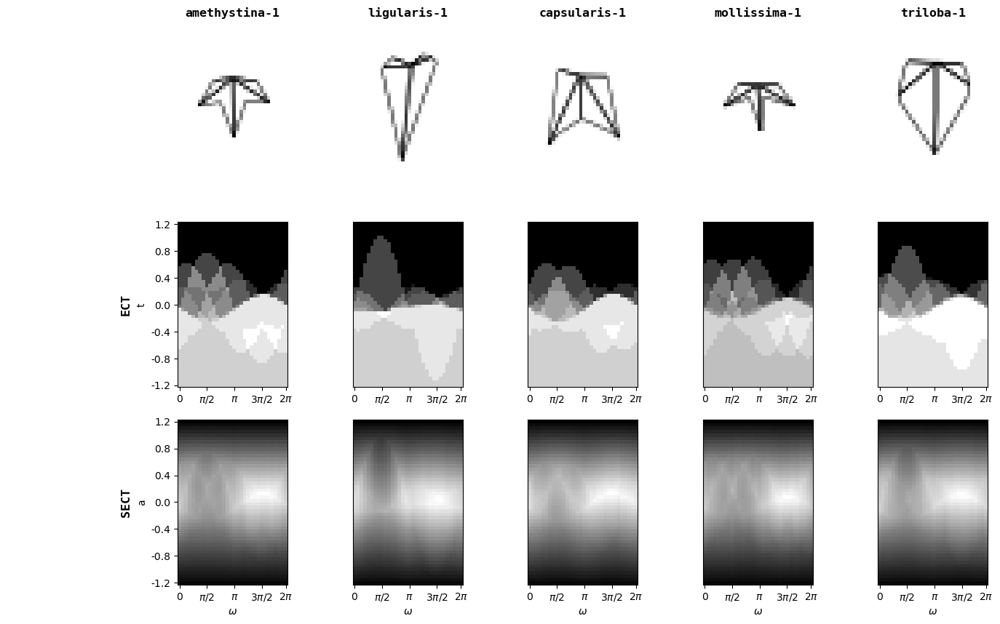

In [65]:
fig = plt.figure(figsize=(15,10))
gs = matplotlib.gridspec.GridSpec(3,5)
plt.style.use('default')

images = []
for i in range(5):
    filedir_original = '../data/leafgraph_images_small/'+ leafgraph_dirs[i] +'.png'
    filedir_ect = '../data/leafgraph_ECT/'+ leafgraph_dirs[i]+'.npy'
    
    image = rescale(np.array(Image.open(filedir_original).convert('L')))
    ect = rescale(np.load(filedir_ect))
    
    ax1= fig.add_subplot(gs[0,i])

    im = ax1.imshow(image, cmap='gray')
    #ax1.set_aspect('equal')
    ax1.set_axis_off()

    
    ax2 = fig.add_subplot(gs[1,i])
    #im2 = ax2.imshow(regtransform(ect)[0,:,:], origin='lower', cmap = 'gray')

    
    ax2.set_xticks([0, 8, 16, 24, 31]) 
    ax2.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
    if i==0:
        ax2.set_ylabel('t')
        ax2.set_yticks(ticks)
        ax2.set_yticklabels([f'{x:1.1f}' for x in tick_labels])
        
    else:
        ax2.set_yticks([])
    images.append(ax2.imshow(regtransform(ect)[0,:,:], origin='lower', cmap = 'gray'))

    
    ax3 = fig.add_subplot(gs[2,i])
    #im3 = ax3.imshow(SECTtransform(ect)[0,:,:], origin='lower', cmap = 'gray')

    ax3.set_xlabel('$\omega$')
    ax3.set_xticks([0, 8, 16, 24, 31]) 
    ax3.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
    if i==0:
        ax3.set_ylabel('a')
        ax3.set_yticks(ticks)
        ax3.set_yticklabels([f'{x:1.1f}' for x in tick_labels])
    else:
        ax3.set_yticks([])

    images.append(ax3.imshow(SECTtransform(ect)[0,:,:], origin='lower', cmap = 'gray'))
    
row_headers = ["Outline", "ECT", "SECT"]
col_headers = ["amethystina-1", "ligularis-1", "capsularis-1","mollissima-1", "triloba-1"]    
font_kwargs = dict(fontfamily="monospace", fontweight="bold", fontsize="large")
add_headers(fig, col_headers=col_headers, row_headers=row_headers, **font_kwargs)

# Find the min and max of all colors for use in setting the color scale.
vmin = min(image.get_array().min() for image in images)
vmax = max(image.get_array().max() for image in images)
print(vmin,vmax)
norm = colors.Normalize(vmin=vmin, vmax=vmax)
for im in images:
    im.set_norm(norm)
#fig.colorbar(images[0], ax=[ax2,ax3], orientation='vertical', pad = 0.0)





plt.savefig('outputs/samples_leafgraph.png', dpi=1000, bbox_inches='tight')

## LEAF OUTLINE VERSION


In [537]:
leafoutline_dirs = ['Cotton/2a_861a', 'Ivy/Vine1_12', 'Tomato/Tomato/field/F2/F_k2_t2','Grape/Geneva_2016/MF_Geneva_2016/483169_b_10', 'Apple/1001_28']


In [538]:
r = 2.9
ticks = np.linspace(0,47,7)
tick_labels = np.linspace(-r,r,7)
print(ticks)
print(tick_labels)

[ 0.          7.83333333 15.66666667 23.5        31.33333333 39.16666667
 47.        ]
[-2.9        -1.93333333 -0.96666667  0.          0.96666667  1.93333333
  2.9       ]


AxesSubplot(0.125,0.653529;0.133621x0.226471)
AxesSubplot(0.125,0.381765;0.133621x0.226471)
AxesSubplot(0.125,0.11;0.133621x0.226471)
AxesSubplot(0.285345,0.653529;0.133621x0.226471)
AxesSubplot(0.285345,0.381765;0.133621x0.226471)
AxesSubplot(0.285345,0.11;0.133621x0.226471)
AxesSubplot(0.44569,0.653529;0.133621x0.226471)
AxesSubplot(0.44569,0.381765;0.133621x0.226471)
AxesSubplot(0.44569,0.11;0.133621x0.226471)
AxesSubplot(0.606034,0.653529;0.133621x0.226471)
AxesSubplot(0.606034,0.381765;0.133621x0.226471)
AxesSubplot(0.606034,0.11;0.133621x0.226471)
AxesSubplot(0.766379,0.653529;0.133621x0.226471)
AxesSubplot(0.766379,0.381765;0.133621x0.226471)
AxesSubplot(0.766379,0.11;0.133621x0.226471)
-1.0 1.0


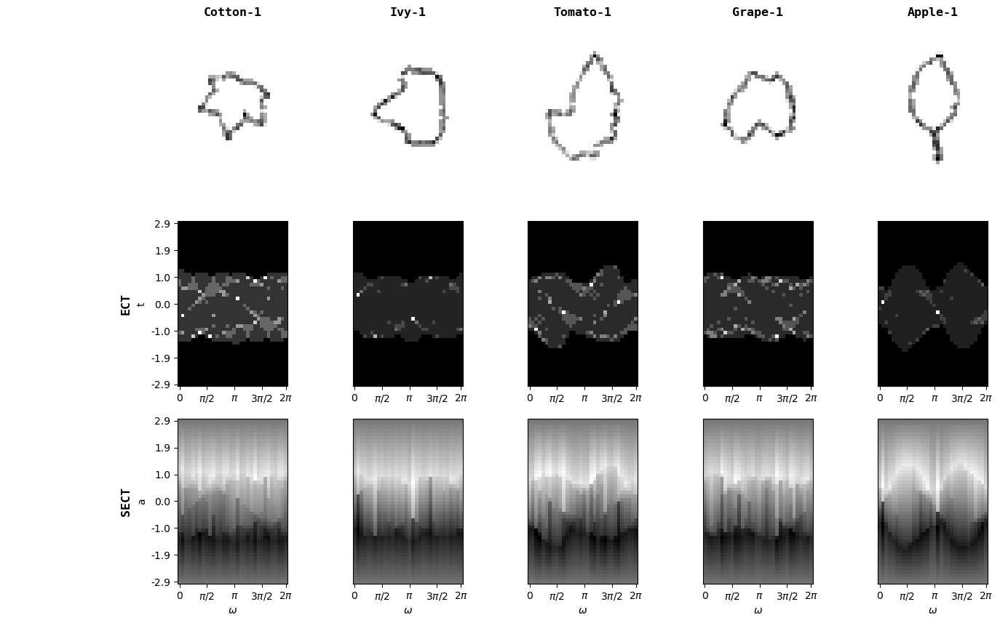

In [59]:
fig = plt.figure(figsize=(15,10))
gs = matplotlib.gridspec.GridSpec(3,5)
plt.style.use('default')

images = []
for i in range(5):
    filedir_original = '../data/ALLleaves_images_small/'+ leafoutline_dirs[i] +'.png'
    filedir_ect = '../data/ALLleaves_ECT/'+ leafoutline_dirs[i]+'.npy'
    
    image = rescale(np.array(Image.open(filedir_original).convert('L')))
    ect = rescale(np.load(filedir_ect))
    
    ax1= fig.add_subplot(gs[0,i])

    im = ax1.imshow(image, cmap='gray')
    #ax1.set_aspect('equal')
    ax1.set_axis_off()

    
    ax2 = fig.add_subplot(gs[1,i])
    #im2 = ax2.imshow(regtransform(ect)[0,:,:], origin='lower', cmap = 'gray')

    
    ax2.set_xticks([0, 8, 16, 24, 31]) 
    ax2.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
    if i==0:
        ax2.set_ylabel('t')
        ax2.set_yticks(ticks)
        ax2.set_yticklabels([f'{x:1.1f}' for x in tick_labels])
        
    else:
        ax2.set_yticks([])
    images.append(ax2.imshow(regtransform(ect)[0,:,:], origin='lower', cmap = 'gray'))

    
    ax3 = fig.add_subplot(gs[2,i])
    #im3 = ax3.imshow(SECTtransform(ect)[0,:,:], origin='lower', cmap = 'gray')

    ax3.set_xlabel('$\omega$')
    ax3.set_xticks([0, 8, 16, 24, 31]) 
    ax3.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
    if i==0:
        ax3.set_ylabel('a')
        ax3.set_yticks(ticks)
        ax3.set_yticklabels([f'{x:1.1f}' for x in tick_labels])
    else:
        ax3.set_yticks([])

    images.append(ax3.imshow(SECTtransform(ect)[0,:,:], origin='lower', cmap = 'gray'))
    
row_headers = ["Outline", "ECT", "SECT"]
col_headers = ["Cotton-1","Ivy-1", "Tomato-1", "Grape-1","Apple-1"]    
font_kwargs = dict(fontfamily="monospace", fontweight="bold", fontsize="large")
add_headers(fig, col_headers=col_headers, row_headers=row_headers, **font_kwargs)

# Find the min and max of all colors for use in setting the color scale.
vmin = min(image.get_array().min() for image in images)
vmax = max(image.get_array().max() for image in images)
print(vmin,vmax)
norm = colors.Normalize(vmin=vmin, vmax=vmax)
for im in images:
    im.set_norm(norm)
#fig.colorbar(images[0], ax=[ax2,ax3], orientation='vertical', pad = 0.0)





plt.savefig('outputs/samples_leafoutline.png', dpi=1000, bbox_inches='tight')

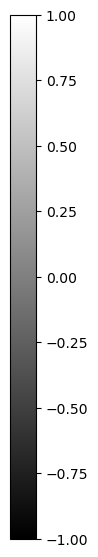

In [306]:
fig,ax = plt.subplots()
plt.colorbar(im,ax=ax)

ax.remove()
#fig.set_figwidth(1.1)
fig.set_figheight(6.8)
plt.savefig('outputs/OnlyColorbar.png', bbox_inches = 'tight', dpi = 300)
plt.savefig('figures/OnlyColorbar.eps', bbox_inches = 'tight')

## Version to show classification results

AxesSubplot(0.125,0.11;0.121473x0.77)
AxesSubplot(0.273197,0.11;0.18221x0.77)
AxesSubplot(0.482132,0.11;0.121473x0.77)
AxesSubplot(0.630329,0.11;0.121473x0.77)
AxesSubplot(0.778527,0.11;0.121473x0.77)


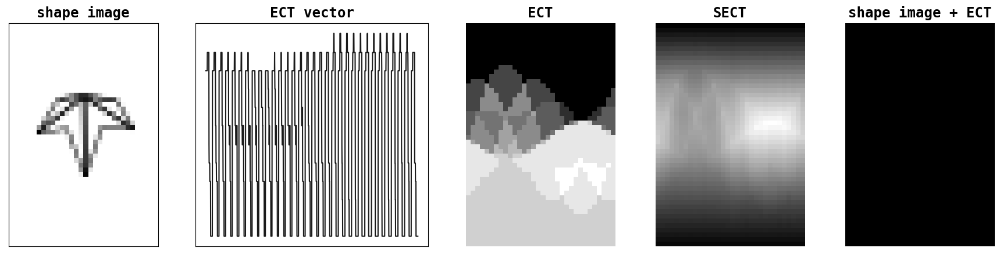

In [287]:
fig = plt.figure(figsize=(22,5))
gs = matplotlib.gridspec.GridSpec(1,5,width_ratios=[1,1.5,1,1,1])
plt.style.use('default')

images = []
#for i in range(5):
#filedir_original = '../data/ALLleaves_images_small/'+ leafoutline_dirs[0] +'.png'
#filedir_ect = '../data/ALLleaves_ECT/'+ leafoutline_dirs[0]+'.npy'
filedir_original = '../data/leafgraph_images_small/'+ leafgraph_dirs[0] +'.png'
filedir_ect = '../data/leafgraph_ECT/'+ leafgraph_dirs[0]+'.npy'
#filedir_original = '../data/mpeg7shap_images_small/'+ mpeg7_dirs[2] +'.png'
#filedir_ect = '../data/mpeg7shap_ECT/'+ mpeg7_dirs[2]+'.npy'

image = rescale(np.array(Image.open(filedir_original).convert('L')))
ect = rescale(np.load(filedir_ect))

ax0= fig.add_subplot(gs[0,0])
im0 = ax0.imshow(image, cmap='gray')
#ax0.set_axis_off()
ax0.set_xticks([])
ax0.set_yticks([])

ax1= fig.add_subplot(gs[0,1])
im1 = ax1.plot(ect.T.flatten(), c='k')
#ax1.set_aspect(100)
ax1.set_xticks([])
ax1.set_yticks([])



ax2 = fig.add_subplot(gs[0,2])
im2 = ax2.imshow(regtransform(ect)[0,:,:], origin='lower', cmap = 'gray')
ax2.set_axis_off()



ax3 = fig.add_subplot(gs[0,3])
im3 = ax3.imshow(SECTtransform(ect)[0,:,:], origin='lower', cmap = 'gray')
ax3.set_axis_off()



ax4= fig.add_subplot(gs[0,4])
im4 = ax4.imshow(np.ones((48,32)), cmap='gray')
#ax1.set_aspect('equal')
ax4.set_axis_off()
#ax4.set_title('title')

    
row_headers = ['']
col_headers = ["shape image", "ECT vector", "ECT","SECT", "shape image + ECT"]    
font_kwargs = dict(fontfamily="monospace", fontweight="bold", fontsize="xx-large")
add_headers(fig, col_headers=col_headers, row_headers=row_headers, **font_kwargs)



plt.savefig('outputs/samples_classification_leafgraph.png', dpi=1000, bbox_inches='tight')

[]

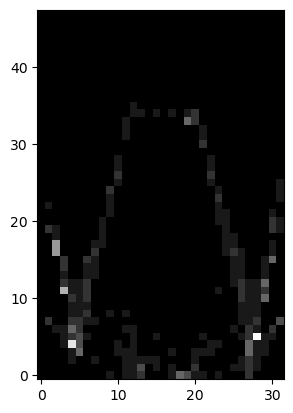

In [315]:
plt.style.use('default')

filedir_ect = '../data/mpeg7shap_ECT/'+ mpeg7_dirs[2]+'.npy'
    
ect = rescale(np.load(filedir_ect))

plt.imshow(regtransform(ect)[0,:,:], origin='lower', cmap = 'gray')

ax.set_xticks([])
ax.set_yticks([])


# Plot ECT vector version

In [75]:
input_filedir = '../data/ALLleaves_ECT/Cotton/2a_861b.npy'
M = np.load(input_filedir)


In [76]:
import seaborn as sns

In [77]:
ECT = M.T.flatten()

In [78]:
A = np.array([[3,4,5],[1,2,3],[1,1,1],[2,2,2],[3,3,3]])
print(A)
B = np.array([[4,5],[1,2],[1,1],[2,2],[3,3]])
print(B)

[[3 4 5]
 [1 2 3]
 [1 1 1]
 [2 2 2]
 [3 3 3]]
[[4 5]
 [1 2]
 [1 1]
 [2 2]
 [3 3]]


In [79]:
A = torch.tensor(A.T)
B = torch.tensor(B.T)

In [80]:
A.shape, B.shape

(torch.Size([3, 5]), torch.Size([2, 5]))

In [81]:
torch.concatenate((A,B), axis=0).shape

torch.Size([5, 5])

In [82]:
ticks = [i*48*2 for i in range(32/2)]

TypeError: 'float' object cannot be interpreted as an integer

Text(0.5, 1.0, 'ECT of Leaf outline for $32$ directions with $48$ thresholds each')

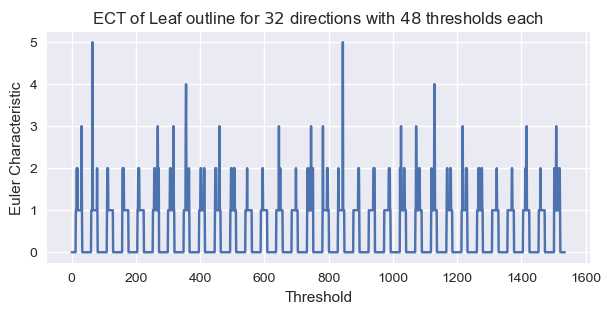

In [83]:
plt.style.use('seaborn')
fig = plt.figure(figsize=(7,3))
plt.plot(ECT)
ax = plt.gca()
plt.xlabel(r'Threshold')
plt.ylabel(r'Euler Characteristic')

plt.title(r'ECT of Leaf outline for $32$ directions with $48$ thresholds each')
#ax.set_xticks(ticks) 
#ax.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])

#plt.savefig('figures/leaf_graph/leaf_ECC_one_direction.png', bbox_inches = 'tight', dpi=300)

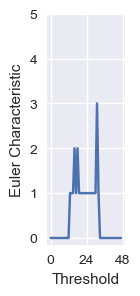

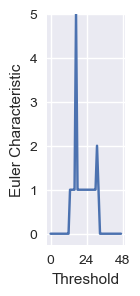

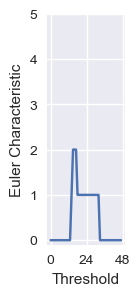

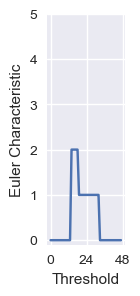

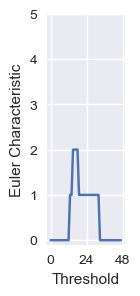

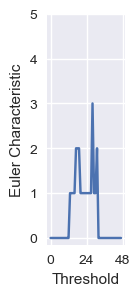

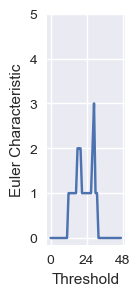

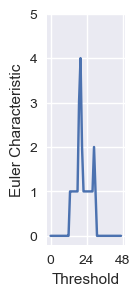

In [95]:
for i in range(8):
    plt.style.use('seaborn')
    fig = plt.figure(figsize=(1,3))
    plt.plot(ECT[i*48:(i*48)+48])
    ax = plt.gca()
    plt.xlabel(r'Threshold')
    plt.ylabel(r'Euler Characteristic')

    #plt.title(r'ECT of Leaf outline for $32$ directions with $48$ thresholds each')
    ax.set_ylim(top=5)
    ax.set_xticks([0,24,48]) 
    ax.set_xticklabels(['0', '24', '48'])

    plt.savefig('figures/leaf_ECC_one_direction'+str(i)+'.png', bbox_inches = 'tight', dpi=300)

Text(447.50252525252523, 0.5, 'threshold')

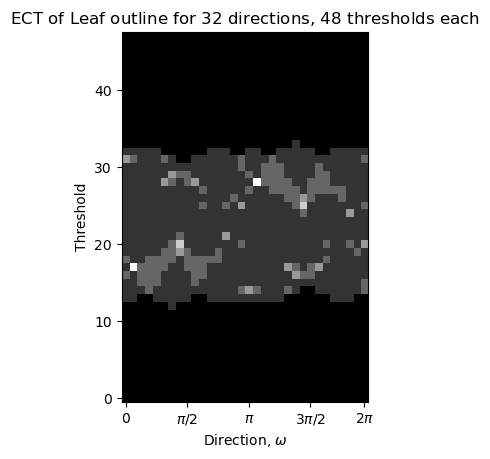

In [168]:
plt.style.use('default')
ax = plt.subplot()
im = ax.imshow(M, origin='lower', cmap='gray')
#plt.axis('off')
#plt.axis('equal')

plt.ylabel(r'Threshold')
plt.xlabel(r'Direction, $\omega$')

plt.title(r'ECT of Leaf outline for $32$ directions, $48$ thresholds each')
ax.set_xticks([0, 8, 16, 24, 31]) 
ax.set_xticklabels(['0', '$\pi$/2', '$\pi$', '$3\pi/2$', '$2\pi$'])
ax2.set_ylabel('threshold')


#plt.savefig('figures/cottonECT.png', dpi=1000, bbox_inches='tight')

(-0.5, 4073.5, 4049.5, -0.5)

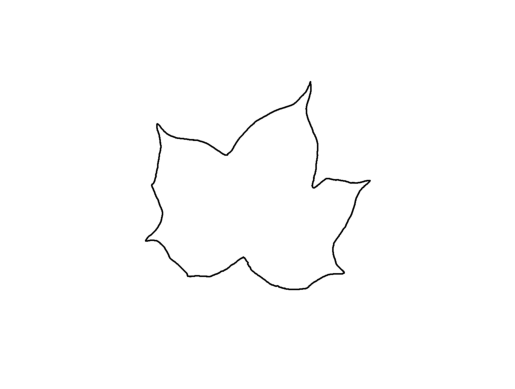

In [147]:
input_filedir = '../data/ALLleaves_ECT_cotton_rotation/rotation0'
outline = cv2.imread(input_filedir+'.png')
plt.imshow(outline)
plt.axis('off')
plt.axis('equal')

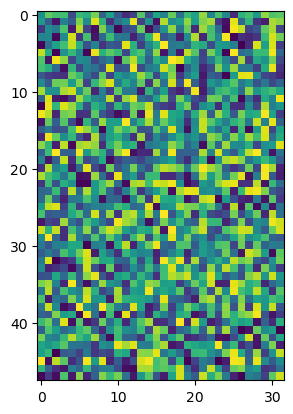

In [318]:
sample=torch.rand([1,48,32])
plt.imshow(sample[0,:,:])

In [322]:
col_means.shape

torch.Size([1, 32])

In [319]:
print(sample.shape)
col_means = torch.mean(sample, dim=1)

# subtract it so that the mean of each column is zero
sample = sample-col_means
# Take integral from bottom to top of matrix (from first to last threshold)
SECT = torch.cumsum(sample, dim=1)

#rescale the tensor image back to [0,1]
SECT_scale = ((SECT - SECT.min()) * (1/(SECT.max() - SECT.min())))

torch.Size([1, 48, 32])


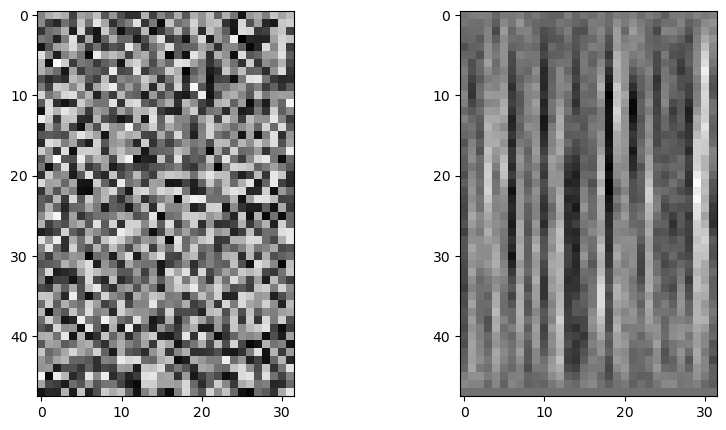

In [323]:
fig, axes = plt.subplots(figsize=(10,5), ncols=2)
axes[0].imshow(sample[0,:,:], cmap='gray')
axes[1].imshow(SECT_scale[0,:,:], cmap='gray')
plt.show()

# Plot kernel size experiment results for SECT on MPEG7 data
e=25, SECT MPEG7, 10-fold cross validation


In [404]:
kernel_sz = [3,5,7,9,11,13, 15]
SECTaccuracy = [87.85714285714286, 93.57142857142858, 95.0 ,95.0 ,96.42857142857142 , 97.85714285714286,97.14285714285715]
SECTstd = [7.857, 5.000, 4.574 , 5.579 , 4.792,3.273 ,3.499]
 

ECTaccuracy = [93.57142857142857, 90.71428571428571,87.85714285714286,84.99999999999999,83.57142857142856, 77.85714285714286, 70.7142857142857]
ECTstd = [6.739, 6.429,8.482,13.72,11.088,20.31, 18.749]

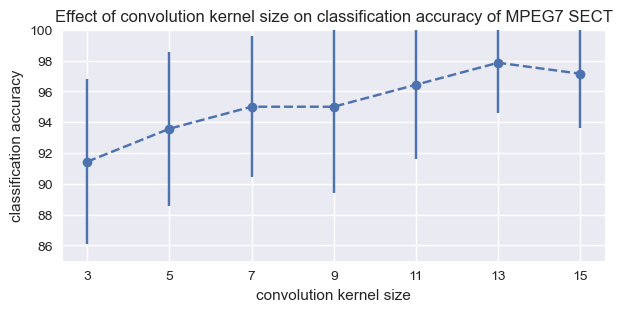

In [405]:
plt.style.use('seaborn')
fig = plt.figure(figsize=(7,3))
#plt.scatter(kernel_sz,accuracy)
plt.errorbar(kernel_sz, accuracy, yerr=std, fmt='--o')

ax = plt.gca()
plt.ylabel(r'classification accuracy')
plt.xlabel(r'convolution kernel size')
plt.title(r'Effect of convolution kernel size on classification accuracy of MPEG7 SECT')
ax.set_ylim([85, 100])
ax.set_xticks(kernel_sz) 
ax.set_xticklabels([str(i) for i in kernel_sz])

plt.savefig('figures/mpeg7_filtersizeSECT.png', bbox_inches = 'tight', dpi=300)




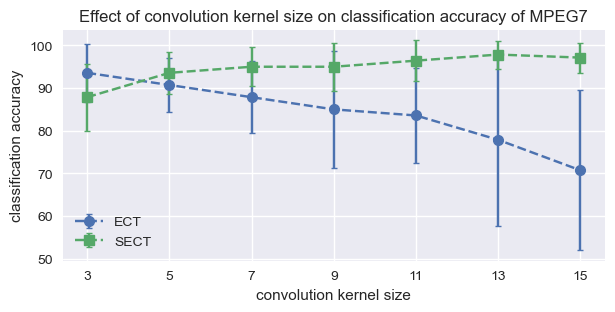

In [423]:
plt.style.use('seaborn')
fig = plt.figure(figsize=(7,3))
plt.errorbar(kernel_sz, ECTaccuracy, yerr=ECTstd, capsize=2,markeredgewidth=1,fmt='o--', label='ECT')
plt.errorbar(kernel_sz, SECTaccuracy, yerr=SECTstd, capsize=2,markeredgewidth=1,fmt='s--', label='SECT')

ax = plt.gca()
plt.ylabel(r'classification accuracy')
plt.xlabel(r'convolution kernel size')
plt.title(r'Effect of convolution kernel size on classification accuracy of MPEG7')
#ax.set_ylim([85, 100])
ax.set_xticks(kernel_sz) 
ax.set_xticklabels([str(i) for i in kernel_sz])
ax.legend()

plt.savefig('figures/mpeg7_filtersize.png', bbox_inches = 'tight', dpi=300)

# Cubical complex examples

In [46]:
import seaborn as sns

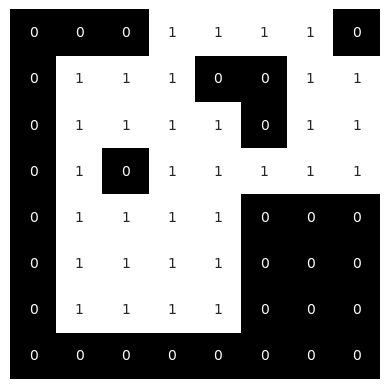

In [58]:
A = np.array([[0,0,0,1,1,1,1,0],[0,1,1,1,0,0,1,1],[0,1,1,1,1,0,1,1],[0,1,0,1,1,1,1,1],[0,1,1,1,1,0,0,0],[0,1,1,1,1,0,0,0],[0,1,1,1,1,0,0,0],[0,0,0,0,0,0,0,0]])
ax = sns.heatmap(A, cmap='gray', annot=True,yticklabels=False, xticklabels=False, cbar=False, square = True)
plt.savefig('figures/binaryImage.png', bbox_inches = 'tight', dpi=300)